In [1]:
# Import file handling packages
import subprocess
import os
import sys

# Import data science packages
import pandas as pd
import sklearn
import umap

# set plotting functions and parameters
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import MaxNLocator
plt.rcParams["font.family"] = "Arial"
plt.rcParams['svg.fonttype'] = 'none'
import arcadia_pycolor as apc

# Import custom utility scripts
sys.path.append('../utils')
import databases
import plotting

# Set reference to top of Git repository
GIT_HOME = subprocess.run(['git', 'rev-parse', '--show-toplevel'], stdout=subprocess.PIPE).stdout.decode("utf-8").strip('\n')
# Set reference to global output directory
GLOBAL_OUTPUT_DIRECTORY = GIT_HOME + '/output/'

# Set directory for current analysis run
output_folder = GLOBAL_OUTPUT_DIRECTORY + '20230418_test/'

---
## 1. Ingest FoldSeek results data

Use `databases.ingest_results()`, which does the following:
- Takes the raw FoldSeek output file `all_by_all_tmscore.tsv`
- Clean it of excess columns and reformat to long-format; save that file with `_cleaned.tsv` suffix
- Pivot long-format matrix to a similarity matrix; save a copy with `_simm_matrix.tsv` suffix
- Return a pandas `DataFrame` with the similarity matrix loaded

In [2]:
# Specify path to foldseek results file
foldseek_results_filepath = output_folder + 'all_by_all_tmscore.tsv'

# This does a bunch of things, as described above. Use help() to find out more
pivoted_df = databases.ingest_results(foldseek_results_filepath, overwrite = True)

Processing /Users/dennis/Code/gene-family-cartography/output/20230418_test/all_by_all_tmscore.tsv and converting to /Users/dennis/Code/gene-family-cartography/output/20230418_test/all_by_all_tmscore_cleaned.tsv.
Done!
Overwriting file at /Users/dennis/Code/gene-family-cartography/output/20230418_test/all_by_all_tmscore_simm_matrix.tsv
Done!


In [3]:
# Inspect df to make sure it looks right
display(pivoted_df.head(3))

target,AF-A0A016UFC9-F1-model_v4-checkpoint.pdb,AF-A0A016UFC9-F1-model_v4.pdb,AF-A0A023EHK0-F1-model_v4.pdb,AF-A0A023FSS9-F1-model_v4.pdb,AF-A0A023G0S7-F1-model_v4.pdb,AF-A0A023G9T4-F1-model_v4.pdb,AF-A0A023GC25-F1-model_v4.pdb,AF-A0A034WTW9-F1-model_v4.pdb,AF-A0A044RAX3-F1-model_v4.pdb,AF-A0A044RHJ8-F1-model_v4.pdb,...,AF-W5N2B7-F1-model_v4.pdb,AF-W5N8M6-F1-model_v4.pdb,AF-W5UKZ8-F1-model_v4.pdb,AF-W6MEX4-F1-model_v4.pdb,AF-W7TY09-F1-model_v4.pdb,AF-X1WGX6-F1-model_v4.pdb,AF-X1XIC8-F1-model_v4.pdb,TSP_Aam1030859_hit1.pdb,TSP_Aam172335_hit1.pdb,TSP_Aam2220_hit1.pdb
query,,,,,,,,,,,,,,,,,,,,,
AF-A0A016UFC9-F1-model_v4-checkpoint.pdb,1.0000,1.0000,0.0,0.4409,0.3803,0.4297,0.3659,0.4398,0.0,0.4161,...,0.4277,0.0000,0.3525,0.0000,0.0,0.3496,0.0000,0.4550,0.4484,0.0
AF-A0A016UFC9-F1-model_v4.pdb,1.0000,1.0000,0.0,0.4409,0.3803,0.4297,0.3659,0.4398,0.0,0.4161,...,0.4277,0.0000,0.3525,0.0000,0.0,0.3496,0.0000,0.4550,0.4484,0.0
AF-A0A023EHK0-F1-model_v4.pdb,0.3623,0.3623,1.0,0.5159,0.4573,0.5584,0.0000,0.4558,0.0,0.5404,...,0.2818,0.5869,0.0000,0.4073,0.0,0.5608,0.7075,0.6143,0.5603,0.0


---
## 2. Load and format feature dataframes

Load in dataframes for the features you want to be able to overlay in scatter plots.  
You should make sure that each dataframe has a column that corresponds to the values in the `index` column of your `pivoted_df`.  
You should also specify a `shared_column` that is the name of that dataframe column in all dataframes.  

For this example, we use the AlphaFold .pdb filename as our `shared_column`.

### 2.1 Load FoldSeek Structural Cluster information

In [4]:
strucluster_df = pd.read_csv(output_folder + 'foldseek_struclusters.tsv', sep = '\t')
display(strucluster_df.head(2))

shared_column = 'filename'

,filename,uniprot_id,StruCluster
0,AF-A0A1L8FE91-F1-model_v4.pdb,A0A1L8FE91,SC0
1,AF-A0A044RHJ8-F1-model_v4.pdb,A0A044RHJ8,SC0


### 2.2 Load UniProtKB mapping results
You can get a lot of information using UniProt ID mapping.  
Here, we have to create a new `'filename'` column in the dataframe to make sure we can aggregate things properly.

In [5]:
pattern = 'AF-*-F1-model_v4.pdb'

uniprot_df = pd.read_csv(output_folder + 'TSP_UniprotKB_mapping_expanded.tsv', sep = '\t')
uniprot_df[shared_column] = uniprot_df['Entry'].apply(lambda x: databases.entry_to_filename(x, pattern))
display(uniprot_df.head(2))

,From,Entry,Reviewed,Entry Name,Protein names,Gene Names,Organism,Length,Taxonomic lineage,Sequence,Fragment,Annotation,Caution,Organism (ID),filename
0,A0A0A0V684,A0A0A0V684,unreviewed,A0A0A0V684_SCYTH,IGFBP N-terminal domain-containing protein,NaN,Scytodes thoracica (Spitting spider) (Aranea t...,92,"Scytodes (genus), Scytodidae (family), Scytodo...",MKSALVIAFALLVVACSLIHVTEAFGCVPGECDPXKCPAVDSCKCG...,NaN,1.0,NaN,1112478,AF-A0A0A0V684-F1-model_v4.pdb
1,A0A4D9ERY4,A0A4D9ERY4,unreviewed,A0A4D9ERY4_9SAUR,BCL-6 corepressor,DR999_PMT07106,Platysternon megacephalum (big-headed turtle),475,"Platysternon (genus), Platysternidae (family),...",MLLWLSWAGGCCLLLLLPGGAAERAAGCPERCDRARCPPVPADCAG...,NaN,1.0,CAUTION: The sequence shown here is derived fr...,55544,AF-A0A4D9ERY4-F1-model_v4.pdb


---
## 3. Aggregate features

Aggregate features using `databases.aggregate_features()`, passing the following arguments:
- `pivoted_df`: the pivoted DataFrame
- `feature_dfs`: a list of DataFrames containing the features you want to aggregate
- `shared_column`: the shared column between all dataframes and the `pivoted_df` that will be used to aggregate them  

This returns a DataFrame with matching order to the `index` of the `pivoted_df` with all relevant information aggregated.  
In cases where the value is `NaN`, this is replaced with the string `None` for compatibility with downstream processes.

In [6]:
feature_dfs = [strucluster_df, uniprot_df] #[, , fragment_df, functional_region_df]

agg_features_df = databases.aggregate_features(pivoted_df, feature_dfs, shared_column)

hardcoded_lengths = {
    'TSP_Aam1030859_hit1.pdb': 107,
    'TSP_Aam172335_hit1.pdb': 107,
    'TSP_Aam2220_hit1.pdb': 83
}

for key, value in hardcoded_lengths.items():
    index = agg_features_df[agg_features_df['filename'] == key].index[0]
    agg_features_df.at[index, 'Length'] = value
    agg_features_df.at[index, 'Annotation'] = 1.0
    agg_features_df.at[index, 'StruCluster'] = 'SC9'
    
display(agg_features_df)

,filename,uniprot_id,StruCluster,From,Entry,Reviewed,Entry Name,Protein names,Gene Names,Organism,Length,Taxonomic lineage,Sequence,Fragment,Annotation,Caution,Organism (ID)
0,AF-A0A016UFC9-F1-model_v4-checkpoint.pdb,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
1,AF-A0A016UFC9-F1-model_v4.pdb,A0A016UFC9,SC7,A0A016UFC9,A0A016UFC9,unreviewed,A0A016UFC9_9BILA,Cysteine-rich motor neuron 1 protein,Acey_s0042.g664 Acey-crm-1 Y032_0042g664,Ancylostoma ceylanicum,897.0,"Ancylostoma (genus), Ancylostomatinae (subfami...",MRRWLWWLTAAATFAALLAQHFAHIDSLLQQHDQQHDCPERCPVCR...,None,2.0,CAUTION: The sequence shown here is derived fr...,53326.0
2,AF-A0A023EHK0-F1-model_v4.pdb,A0A023EHK0,SC4,A0A023EHK0,A0A023EHK0,unreviewed,A0A023EHK0_AEDAL,Putative cysteine-rich motor neuron 1 protein,None,Aedes albopictus (Asian tiger mosquito) (Stego...,190.0,"Stegomyia (subgenus), Aedes (genus), Aedini (t...",MIYFLLVLDVRAFALKCVCNPNECDIIRSEDCPGKGYIVWDPCRCC...,None,1.0,None,7160.0
3,AF-A0A023FSS9-F1-model_v4.pdb,A0A023FSS9,SC9,A0A023FSS9,A0A023FSS9,unreviewed,A0A023FSS9_AMBCJ,Putative secreted protein,None,Amblyomma cajennense (Cayenne tick) (Acarus ca...,108.0,"Amblyomma (genus), Amblyomminae (subfamily), I...",MKAALLLLVVLAVAVIGTLATSAPNCDAGCDKSKCPNPASCKCGTF...,None,1.0,None,34607.0
4,AF-A0A023G0S7-F1-model_v4.pdb,A0A023G0S7,SC9,A0A023G0S7,A0A023G0S7,unreviewed,A0A023G0S7_AMBTT,Putative secreted protein,None,Amblyomma triste (Neotropical tick),126.0,"Amblyomma (genus), Amblyomminae (subfamily), I...",MSYAWYLTSSDIPLFKMKTSVVLVVSMVITSVLSTSPPNCANVNCA...,None,1.0,None,251400.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1733,AF-X1WGX6-F1-model_v4.pdb,X1WGX6,SC9,X1WGX6,X1WGX6,unreviewed,X1WGX6_DANRE,Si:ch73-330k17.3,si:ch73-330k17.3,Danio rerio (Zebrafish) (Brachydanio rerio),221.0,"Danio (genus), Danioninae (subfamily), Danioni...",MRPCILLILWMITAVEMEEQKILQSLHCPPCERIHCSPRRALKLQC...,None,1.0,None,7955.0
1734,AF-X1XIC8-F1-model_v4.pdb,X1XIC8,SC0,None,None,None,None,None,None,None,None,None,None,None,None,None,None
1735,TSP_Aam1030859_hit1.pdb,None,SC9,None,None,None,None,None,None,None,107,None,None,None,1.0,None,None
1736,TSP_Aam172335_hit1.pdb,None,SC9,None,None,None,None,None,None,None,107,None,None,None,1.0,None,None


### 3.1 Export feature files for downstream analysis

In [7]:
agg_features_df.to_csv(output_folder + 'TSP_all_features.tsv', index = None, sep = '\t')

In [8]:
proteins_by_strucluster = agg_features_df[['From', 'Entry', 'StruCluster', 'filename']]
proteins_by_strucluster.rename({'From': 'Genbank_id', 'Entry': 'uniprot_id'})
proteins_by_strucluster.to_csv(output_folder + 'TSP_proteins_by_FoldSeek_strucluster.tsv', index = None, sep = '\t')

---
## 4. Calculate embeddings

In [9]:
random_state = 20230301

PCA_features = plotting.calculate_PCA(pivoted_df, agg_features_df)
TSNE_features = plotting.calculate_TSNE(pivoted_df, agg_features_df, 
                                        random_state = random_state, learning_rate = 'auto', init = 'pca')
UMAP_features = plotting.calculate_UMAP(pivoted_df, agg_features_df, random_state = random_state)

Initializing PCA function.
Calculating PCA...
Done!
Initializing TSNE function.
Calculating TSNE...
Done!
Initializing UMAP function.
Calculating UMAP...
Done!


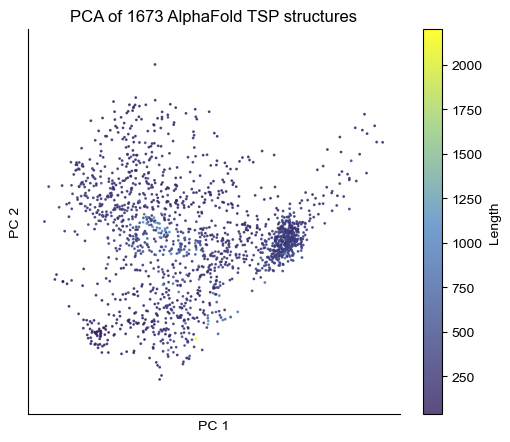

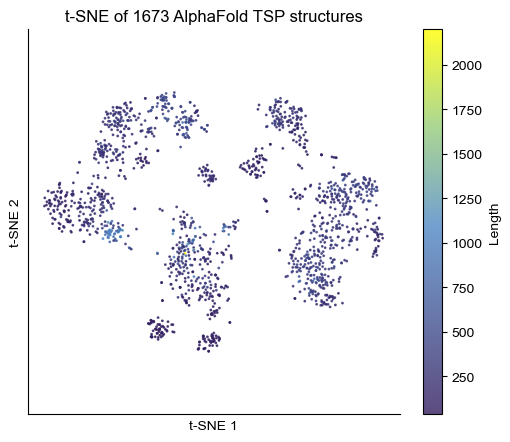

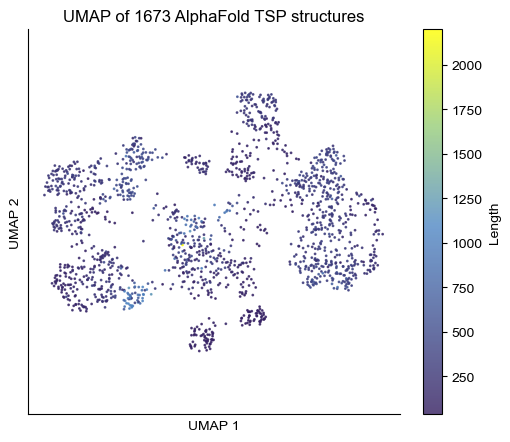

In [10]:
figures_folder = output_folder + 'figures/'

PCA_features = PCA_features[PCA_features['Length'] != 'None']
TSNE_features = TSNE_features[TSNE_features['Length'] != 'None']
UMAP_features = UMAP_features[UMAP_features['Length'] != 'None']

pca_plot_loc = figures_folder + 'TSP-insulin_filtered_length_PCA.svg'
plotting.plot_static_continuous(features_df = PCA_features, feature = 'Length', cmap = 'arcadia:viridis',
           title = 'PCA of {} AlphaFold TSP structures'.format(str(len(PCA_features))), 
           xlabel = 'PC 1', ylabel = 'PC 2', save_to = pca_plot_loc,
           s = 1, alpha = 0.8)
            
tsne_plot_loc = figures_folder + 'TSP-insulin_filtered_length_tSNE.svg'
plotting.plot_static_continuous(features_df = TSNE_features, feature = 'Length', cmap = 'arcadia:viridis', 
           title = 't-SNE of {} AlphaFold TSP structures'.format(str(len(PCA_features))), 
           xlabel = 't-SNE 1', ylabel = 't-SNE 2', save_to = tsne_plot_loc,
           s = 1, alpha = 0.8)

umap_plot_loc = figures_folder + 'TSP-insulin_filtered_length_UMAP.svg'
plotting.plot_static_continuous(features_df = UMAP_features, feature = 'Length', cmap = 'arcadia:viridis',
           title = 'UMAP of {} AlphaFold TSP structures'.format(str(len(PCA_features))), 
           xlabel = 'UMAP 1', ylabel = 'UMAP 2', save_to = umap_plot_loc,
           s = 1, alpha = 0.8)

## 6. Plot a categorical feature on a static plot

In [11]:
import arcadia_pycolor as apc
colors = list(apc.arcadia_Accent_all.values())
pca_color_mapper = plotting.make_color_mapper(PCA_features, 'StruCluster', colors, permute = [0.75])

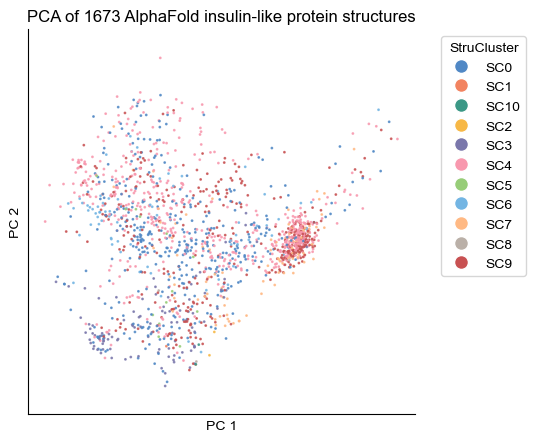

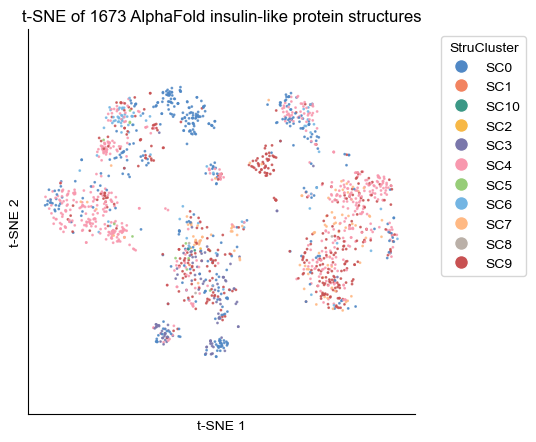

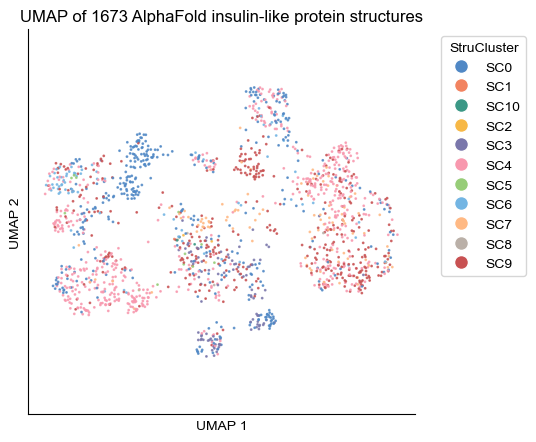

In [12]:
cluster_pca_plot_loc = figures_folder + 'TSP-insulin_filtered_SC_PCA.svg'
plotting.plot_static_categorical(features_df = PCA_features, feature = 'StruCluster', color_mapper = pca_color_mapper,
               title = 'PCA of {} AlphaFold insulin-like protein structures'.format(len(PCA_features)),
               xlabel = 'PC 1', ylabel = 'PC 2', figsize = (5, 5), save_to = cluster_pca_plot_loc, 
               s = 1, alpha = 0.8)

cluster_tsne_plot_loc = figures_folder + 'TSP-insulin_filtered_SC_tSNE.svg'
plotting.plot_static_categorical(features_df = TSNE_features, feature = 'StruCluster', color_mapper = pca_color_mapper,
               title = 't-SNE of {} AlphaFold insulin-like protein structures'.format(len(PCA_features)),
               xlabel = 't-SNE 1', ylabel = 't-SNE 2', figsize = (5, 5), save_to = cluster_tsne_plot_loc, 
               s = 1, alpha = 0.8)

cluster_umap_plot_loc = figures_folder + 'TSP-insulin_filtered_SC_UMAP.svg'
plotting.plot_static_categorical(features_df = UMAP_features, feature = 'StruCluster', color_mapper = pca_color_mapper,
               title = 'UMAP of {} AlphaFold insulin-like protein structures'.format(len(PCA_features)),
               xlabel = 'UMAP 1', ylabel = 'UMAP 2', figsize = (5, 5), save_to = cluster_umap_plot_loc, 
               s = 1, alpha = 0.8)

## 7. Manually specifying a `color_mapper` dictionary

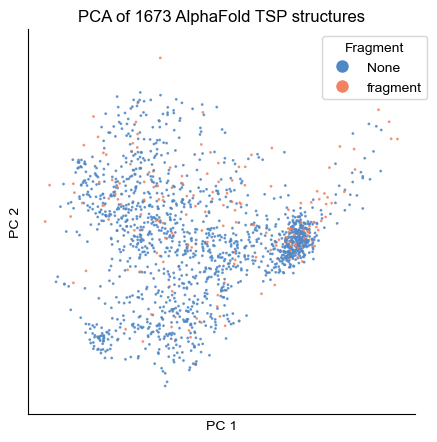

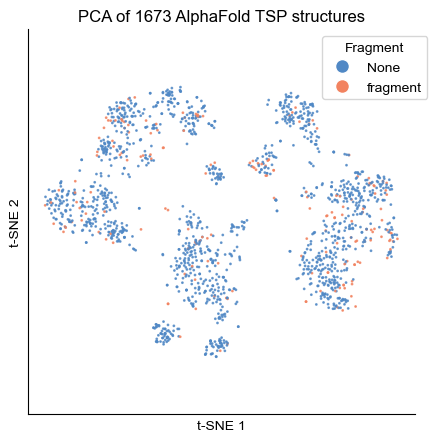

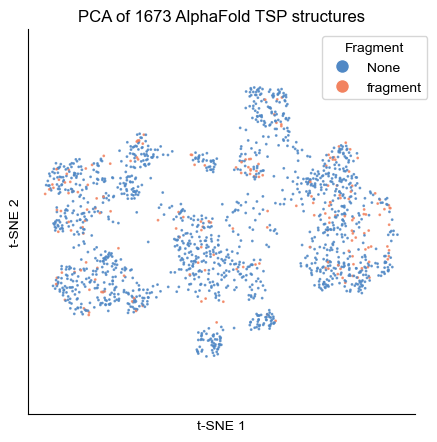

In [13]:
colors = list(apc.arcadia_Accent_all.values())

fragment_color_mapper = {
    'None': apc.arcadia_Accent_all['arcadia:aegean'],
    'fragment': apc.arcadia_Accent_all['arcadia:amber']
}

fragment_pca_plot_loc = figures_folder + 'TSP_filtered_fragment_PCA.svg'
plotting.plot_static_categorical(features_df = PCA_features, feature = 'Fragment', color_mapper = fragment_color_mapper,
               title = 'PCA of {} AlphaFold TSP structures'.format(len(PCA_features)),
               xlabel = 'PC 1', ylabel = 'PC 2', figsize = (5, 5), save_to = fragment_pca_plot_loc, 
               s = 1, alpha = 0.8, return_colors = True, hide_None = False)

fragment_tsne_plot_loc = figures_folder + 'TSP_filtered_fragment_tSNE.svg'
plotting.plot_static_categorical(features_df = TSNE_features, feature = 'Fragment', color_mapper = fragment_color_mapper,
               title = 'PCA of {} AlphaFold TSP structures'.format(len(PCA_features)),
               xlabel = 't-SNE 1', ylabel = 't-SNE 2', figsize = (5, 5), save_to = fragment_tsne_plot_loc, 
               s = 1, alpha = 0.8, hide_None = False)

fragment_umap_plot_loc = figures_folder + 'TSP_filtered_fragment_UMAP.svg'
plotting.plot_static_categorical(features_df = UMAP_features, feature = 'Fragment', color_mapper = fragment_color_mapper,
               title = 'PCA of {} AlphaFold TSP structures'.format(len(PCA_features)),
               xlabel = 't-SNE 1', ylabel = 't-SNE 2', figsize = (5, 5), save_to = fragment_umap_plot_loc, 
               s = 1, alpha = 0.8, hide_None = False)

## 8. Sequential PCA → t-SNE or UMAP

In [14]:
n_components = 30

PCA_30_features = plotting.calculate_PCA(pivoted_df, agg_features_df, n_components = n_components)
PCA_TSNE_features = plotting.calculate_TSNE(PCA_30_features, agg_features_df, 
                                        random_state = random_state, learning_rate = 'auto', init = 'pca')
PCA_UMAP_features = plotting.calculate_UMAP(PCA_30_features, agg_features_df, random_state = random_state)

PCA_TSNE_features = PCA_TSNE_features[PCA_TSNE_features['Length'] != 'None']
PCA_UMAP_features = PCA_UMAP_features[PCA_UMAP_features['Length'] != 'None']

Initializing PCA function.
Calculating PCA...
Done!
Initializing TSNE function.
Calculating TSNE...
Done!
Initializing UMAP function.
Calculating UMAP...
Done!


## 9. Inherit coloring from another plot using `return_colors = True`

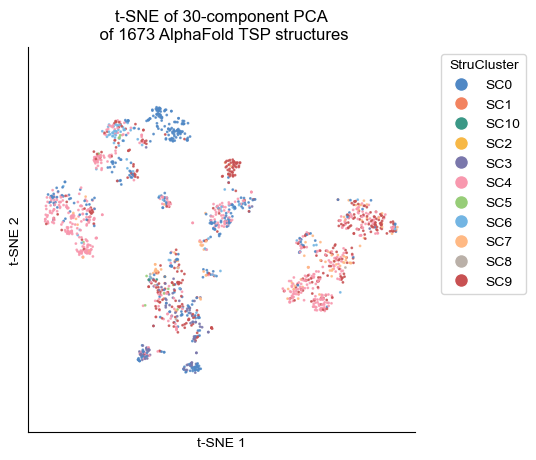

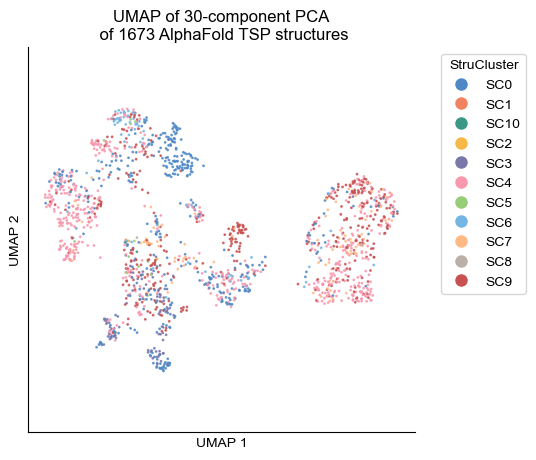

In [15]:
colors = list(apc.arcadia_Accent_all.values())

cluster_pca_tsne_plot_loc = figures_folder + 'TSP_filtered_SC_PCA-UMAP.svg'
pca_color_mapper_2 = plotting.plot_static_categorical(features_df = PCA_TSNE_features, feature = 'StruCluster', color_list = colors, permute = [0.75],
               title = 't-SNE of {}-component PCA\n of {} AlphaFold TSP structures'.format(n_components, len(PCA_features)),
               xlabel = 't-SNE 1', ylabel = 't-SNE 2', figsize = (5, 5), save_to = cluster_pca_tsne_plot_loc, 
               s = 1, alpha = 0.8, return_colors = True)

cluster_pca_umap_plot_loc = figures_folder + 'TSP_filtered_SC_PCA-tSNE.svg'
plotting.plot_static_categorical(features_df = PCA_UMAP_features , feature = 'StruCluster', color_mapper = pca_color_mapper_2,
               title = 'UMAP of {}-component PCA\n of {} AlphaFold TSP structures'.format(n_components, len(PCA_features)),
               xlabel = 'UMAP 1', ylabel = 'UMAP 2', figsize = (5, 5), save_to = cluster_pca_umap_plot_loc, 
               s = 1, alpha = 0.8)

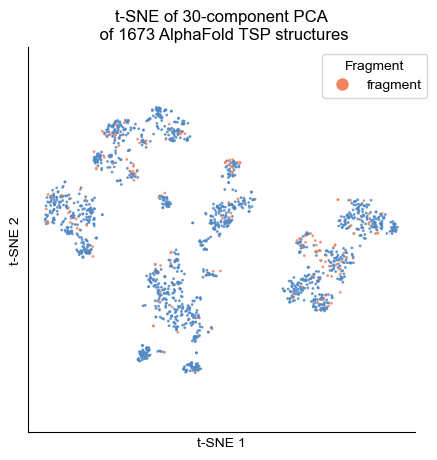

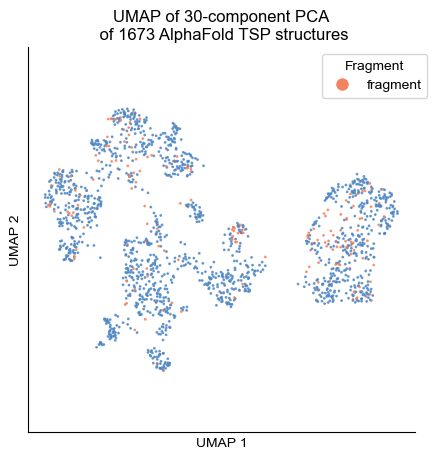

In [16]:
fragment_pca_tsne_plot_loc = figures_folder + 'TSP_filtered_fragment_PCA-UMAP.svg'
plotting.plot_static_categorical(features_df = PCA_TSNE_features, feature = 'Fragment', color_mapper = fragment_color_mapper,
               title = 't-SNE of {}-component PCA\n of {} AlphaFold TSP structures'.format(n_components, len(PCA_features)),
               xlabel = 't-SNE 1', ylabel = 't-SNE 2', figsize = (5, 5), save_to = fragment_pca_tsne_plot_loc, 
               s = 1, alpha = 0.8)

fragment_pca_umap_plot_loc = figures_folder + 'TSP_filtered_fragment_PCA-tSNE.svg'
plotting.plot_static_categorical(features_df = PCA_UMAP_features , feature = 'Fragment', color_mapper = fragment_color_mapper,
               title = 'UMAP of {}-component PCA\n of {} AlphaFold TSP structures'.format(n_components, len(PCA_features)),
               xlabel = 'UMAP 1', ylabel = 'UMAP 2', figsize = (5, 5), save_to = fragment_pca_umap_plot_loc, 
               s = 1, alpha = 0.8)

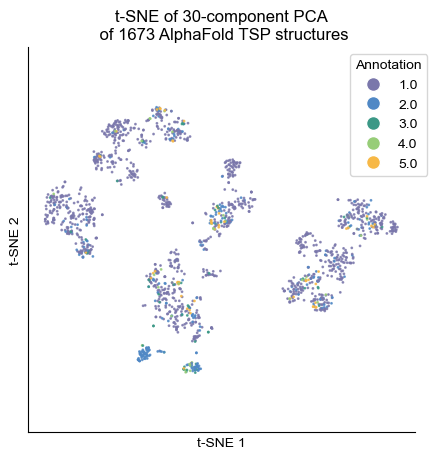

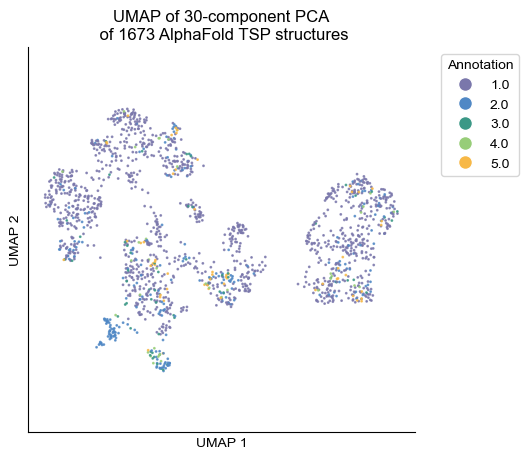

In [17]:
annotation_color_mapper = {
    1.0: apc.arcadia_Accent_all['arcadia:aster'],
    2.0: apc.arcadia_Accent_all['arcadia:aegean'],
    3.0: apc.arcadia_Accent_all['arcadia:seaweed'],
    4.0: apc.arcadia_Accent_all['arcadia:lime'],
    5.0: apc.arcadia_Accent_all['arcadia:canary'],
    'None': '#FFFFFF'
}

fragment_pca_tsne_plot_loc = figures_folder + 'TSP_filtered_score_PCA-UMAP.svg'
plotting.plot_static_categorical(features_df = PCA_TSNE_features, feature = 'Annotation', color_mapper = annotation_color_mapper,
               title = 't-SNE of {}-component PCA\n of {} AlphaFold TSP structures'.format(n_components, len(PCA_features)),
               xlabel = 't-SNE 1', ylabel = 't-SNE 2', figsize = (5, 5), save_to = fragment_pca_tsne_plot_loc, 
               s = 1, alpha = 0.8)

fragment_pca_umap_plot_loc = figures_folder + 'TSP_filtered_score_PCA-tSNE.svg'
plotting.plot_static_categorical(features_df = PCA_UMAP_features , feature = 'Annotation', color_mapper = annotation_color_mapper,
               title = 'UMAP of {}-component PCA\n of {} AlphaFold TSP structures'.format(n_components, len(PCA_features)),
               xlabel = 'UMAP 1', ylabel = 'UMAP 2', figsize = (5, 5), save_to = fragment_pca_umap_plot_loc, 
               s = 1, alpha = 0.8)

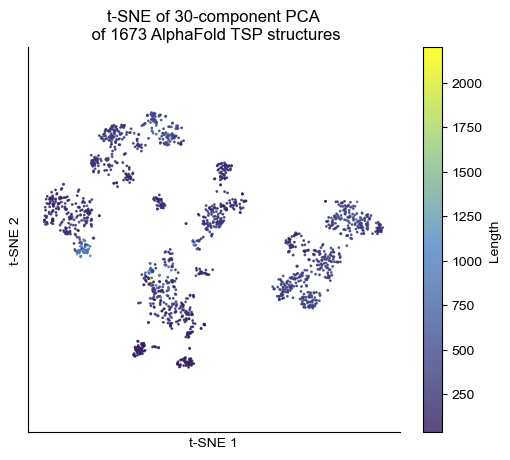

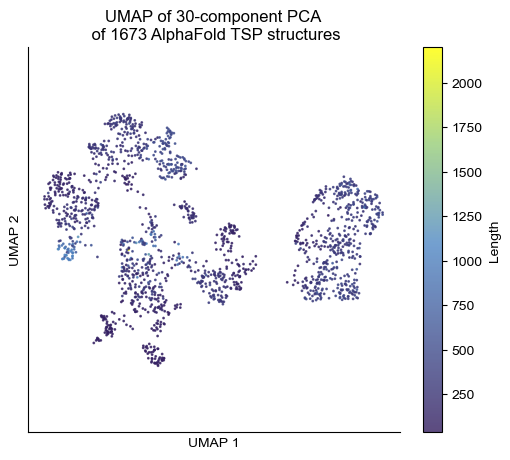

In [18]:
fragment_pca_tsne_plot_loc = figures_folder + 'TSP_filtered_length_PCA-UMAP.svg'
plotting.plot_static_continuous(features_df = PCA_TSNE_features, feature = 'Length', cmap = 'arcadia:viridis',
               title = 't-SNE of {}-component PCA\n of {} AlphaFold TSP structures'.format(n_components, len(PCA_features)),
               xlabel = 't-SNE 1', ylabel = 't-SNE 2', figsize = (6, 5), save_to = fragment_pca_tsne_plot_loc, 
               s = 1, alpha = 0.8)

fragment_pca_umap_plot_loc = figures_folder + 'TSP_filtered_length_PCA-tSNE.svg'
plotting.plot_static_continuous(features_df = PCA_UMAP_features , feature = 'Length', cmap = 'arcadia:viridis',
               title = 'UMAP of {}-component PCA\n of {} AlphaFold TSP structures'.format(n_components, len(PCA_features)),
               xlabel = 'UMAP 1', ylabel = 'UMAP 2', figsize = (6, 5), save_to = fragment_pca_umap_plot_loc, 
               s = 1, alpha = 0.8)

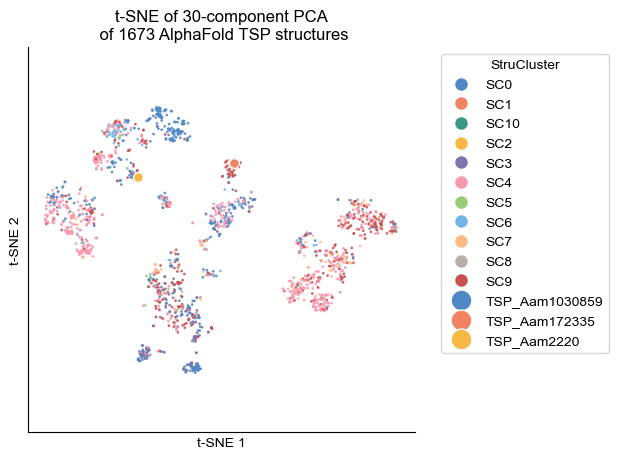

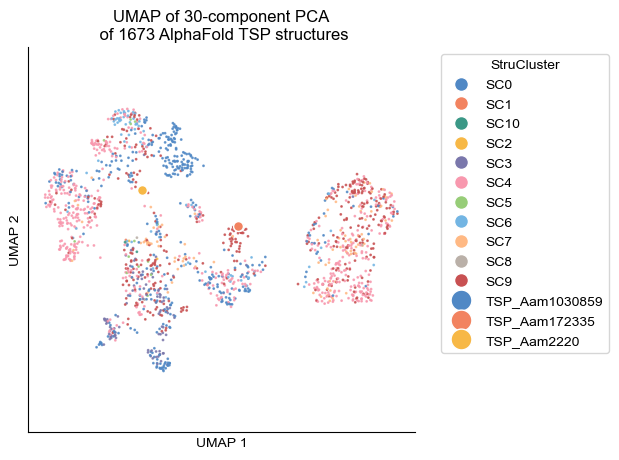

In [19]:
key_points_dict = {
    'TSP_Aam1030859_hit1.pdb': ['TSP_Aam1030859', apc.arcadia_all['arcadia:aegean']],
    'TSP_Aam172335_hit1.pdb': ['TSP_Aam172335', apc.arcadia_all['arcadia:amber']],
    'TSP_Aam2220_hit1.pdb': ['TSP_Aam2220', apc.arcadia_all['arcadia:canary']]
}

cluster_pca_tsne_plot_loc = figures_folder + 'TSP_filtered_SC_PCA-UMAP.svg'
pca_color_mapper_2 = plotting.plot_static_categorical(features_df = PCA_TSNE_features, feature = 'StruCluster', color_list = colors, permute = [0.75],
               title = 't-SNE of {}-component PCA\n of {} AlphaFold TSP structures'.format(n_components, len(PCA_features)),
               xlabel = 't-SNE 1', ylabel = 't-SNE 2', figsize = (5, 5), save_to = cluster_pca_tsne_plot_loc, 
               key_points_dict = key_points_dict, key_points_size = 50,
               s = 1, alpha = 0.8, return_colors = True)

cluster_pca_umap_plot_loc = figures_folder + 'TSP_filtered_SC_PCA-tSNE.svg'
plotting.plot_static_categorical(features_df = PCA_UMAP_features , feature = 'StruCluster', color_mapper = pca_color_mapper_2,
               title = 'UMAP of {}-component PCA\n of {} AlphaFold TSP structures'.format(n_components, len(PCA_features)),
               xlabel = 'UMAP 1', ylabel = 'UMAP 2', figsize = (5, 5), save_to = cluster_pca_umap_plot_loc,
               key_points_dict = key_points_dict, key_points_size = 50,
               s = 1, alpha = 0.8)

In [20]:
groupedby_agg_df = agg_features_df[agg_features_df['StruCluster'] != 'None'].groupby('StruCluster').agg(lambda x: [i for i in x])['Protein names']

summary_dict = {}
str_summary_dict = {}
len_dict = {}

wc_dict = {}

from wordcloud import WordCloud

exclude_words = ['protein', 'None']

for i, (clu, values) in enumerate(groupedby_agg_df.items()):
    summary_dict[clu] = pd.DataFrame(pd.value_counts(values))
    len_dict[clu] = len(values)
    annot_word_list = ' '.join(list(values)).split(' ')
    sanitized_word_list = [word for word in annot_word_list if word not in exclude_words]
    str_summary = dict(pd.value_counts( sanitized_word_list, normalize = True))
    str_summary_dict[clu] = str_summary
    wc_dict[clu] = WordCloud(width = 500, height = 500,
                             background_color = 'white',
                            color_func = lambda *args, **kwargs: colors[i]).generate_from_frequencies(str_summary)

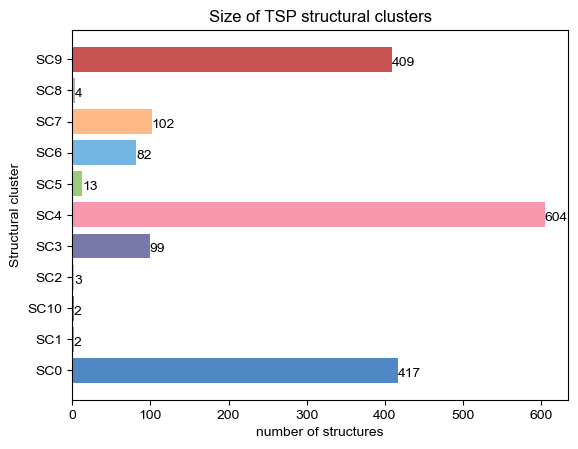

In [21]:
plt.barh(y = np.arange(len(len_dict)), width = len_dict.values(), color = colors, tick_label = list(len_dict.keys()))

for i, (key, value) in enumerate(len_dict.items()):
    plt.text(x = value, y = i - 0.2, s = value)
    
plt.xlabel('number of structures')
plt.ylabel('Structural cluster')

plt.title('Size of TSP structural clusters')
plt.savefig(output_folder + 'figures/TSP_cluster_sizes.svg', bbox_inches = 'tight')
plt.show()

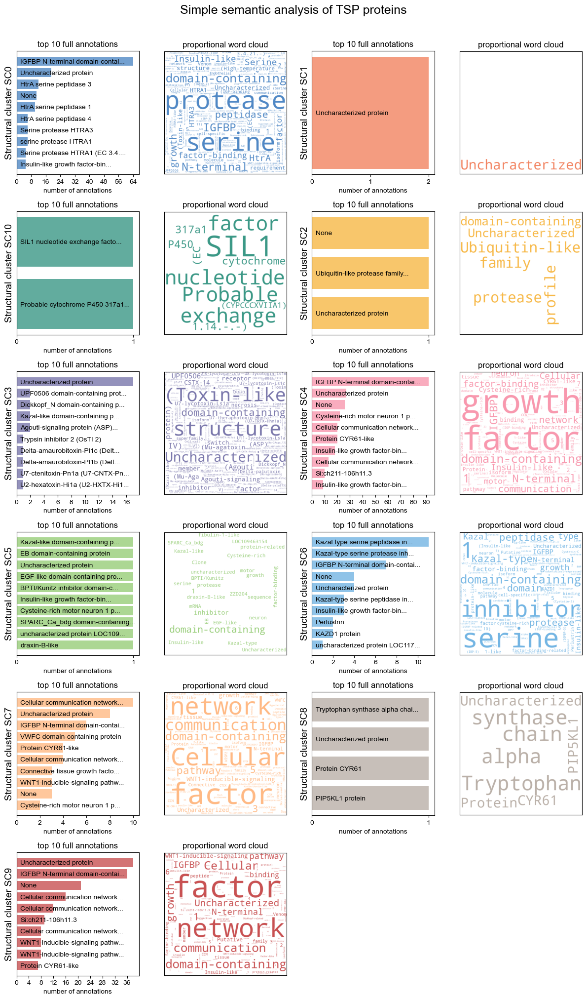

In [22]:
top_n = 10
max_str_len = 30

plt.figure(figsize = (12, 20))
plt.suptitle('Simple semantic analysis of TSP proteins', y = 1.01, fontsize = 18)

for i, clu in enumerate(summary_dict.keys()):
    plt.subplot(6, 4, i * 2 + 1)
    
    top_n_df = summary_dict[clu].head(top_n)
    
    labels = [i[:max_str_len] + '...' if len(i) > max_str_len else i for i in list(top_n_df.index)]
    widths = list(top_n_df['count'])
    
    plt.barh(y = np.arange(len(widths)), width = widths, tick_label = labels, color = colors[i], alpha = 0.8)
    plt.gca().invert_yaxis()
    plt.setp(plt.gca().yaxis.get_majorticklabels(), ha="left", x = 0.05)
    plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
    plt.gca().tick_params(axis = 'y', length = 0)
    plt.ylabel(f'Structural cluster {clu}', fontsize = 14)
    plt.xlabel('number of annotations')
    plt.title(f'top {top_n} full annotations')
    
    plt.subplot(6, 4, i * 2 + 2)
    plt.imshow(wc_dict[clu])
    plt.gca().set_xticks([])
    plt.gca().set_yticks([])
    plt.title('proportional word cloud')

plt.tight_layout()

plt.savefig(output_folder + 'figures/TSP_protein_semantic_analysis.svg', bbox_inches = 'tight')
plt.show()

In [23]:
agg_features_df_taxlineage = agg_features_df.copy(deep = True)

#entry.partition('(*)')[1].strip('()'): entry.split(' ') for entry in 
taxlineage_unpacker = lambda x: {entry.split(' (')[0]: entry.split(' (')[1].strip(')') for entry in x.split(', ')} if x != 'None' else {}

def taxlineage_aggregator(input_dict):
    output_dict = {}
    for value, category in input_dict.items():
        if category not in output_dict:
            output_dict[category] = [value]
        else:
            output_dict[category] = output_dict[category] + [value]
    output_dict = {key: value.pop() if len(value) == 1 else value for key, value in output_dict.items()}
    return output_dict

agg_features_df_taxlineage['taxlineage_dict'] = agg_features_df_taxlineage['Taxonomic lineage'].apply(taxlineage_unpacker)
agg_features_df_taxlineage['taxlineage_summary'] = agg_features_df_taxlineage['taxlineage_dict'].apply(taxlineage_aggregator)

In [24]:
selectors = ['Parasitiformes', 'Arachnida', 'Insecta', 'Arthropoda', 'Vertebrata', 'Metazoa', 'Fungi', 'Eukaryota', 'Bacteria', 'Archaea']

def categorical_binder(dix, categories, hierarchical = False):
    output = []
    for item in dix.keys():
        if item in categories:
            output.append(item)
    
    if output == []:
        output.append('Other')
    
    if hierarchical:
        return output[0]
    else:
        return ''.join(output)

agg_features_df_taxlineage['broad_taxon'] = agg_features_df_taxlineage['taxlineage_dict'].apply(lambda x: categorical_binder(x, selectors, hierarchical = True))
display(agg_features_df_taxlineage)

hardcoded_taxa = {
    'TSP_Aam1030859_hit1.pdb': 'Parasitiformes',
    'TSP_Aam172335_hit1.pdb': 'Parasitiformes',
    'TSP_Aam2220_hit1.pdb': 'Parasitiformes'
}

for key, value in hardcoded_taxa.items():
    index = agg_features_df_taxlineage[agg_features_df_taxlineage['filename'] == key].index[0]
    agg_features_df_taxlineage.at[index, 'broad_taxon'] = value
    
display(agg_features_df)

,filename,uniprot_id,StruCluster,From,Entry,Reviewed,Entry Name,Protein names,Gene Names,Organism,Length,Taxonomic lineage,Sequence,Fragment,Annotation,Caution,Organism (ID),taxlineage_dict,taxlineage_summary,broad_taxon
0,AF-A0A016UFC9-F1-model_v4-checkpoint.pdb,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,{},{},Other
1,AF-A0A016UFC9-F1-model_v4.pdb,A0A016UFC9,SC7,A0A016UFC9,A0A016UFC9,unreviewed,A0A016UFC9_9BILA,Cysteine-rich motor neuron 1 protein,Acey_s0042.g664 Acey-crm-1 Y032_0042g664,Ancylostoma ceylanicum,897.0,"Ancylostoma (genus), Ancylostomatinae (subfami...",MRRWLWWLTAAATFAALLAQHFAHIDSLLQQHDQQHDCPERCPVCR...,None,2.0,CAUTION: The sequence shown here is derived fr...,53326.0,"{'Ancylostoma': 'genus', 'Ancylostomatinae': '...","{'genus': 'Ancylostoma', 'subfamily': 'Ancylos...",Metazoa
2,AF-A0A023EHK0-F1-model_v4.pdb,A0A023EHK0,SC4,A0A023EHK0,A0A023EHK0,unreviewed,A0A023EHK0_AEDAL,Putative cysteine-rich motor neuron 1 protein,None,Aedes albopictus (Asian tiger mosquito) (Stego...,190.0,"Stegomyia (subgenus), Aedes (genus), Aedini (t...",MIYFLLVLDVRAFALKCVCNPNECDIIRSEDCPGKGYIVWDPCRCC...,None,1.0,None,7160.0,"{'Stegomyia': 'subgenus', 'Aedes': 'genus', 'A...","{'subgenus': 'Stegomyia', 'genus': 'Aedes', 't...",Insecta
3,AF-A0A023FSS9-F1-model_v4.pdb,A0A023FSS9,SC9,A0A023FSS9,A0A023FSS9,unreviewed,A0A023FSS9_AMBCJ,Putative secreted protein,None,Amblyomma cajennense (Cayenne tick) (Acarus ca...,108.0,"Amblyomma (genus), Amblyomminae (subfamily), I...",MKAALLLLVVLAVAVIGTLATSAPNCDAGCDKSKCPNPASCKCGTF...,None,1.0,None,34607.0,"{'Amblyomma': 'genus', 'Amblyomminae': 'subfam...","{'genus': 'Amblyomma', 'subfamily': 'Amblyommi...",Parasitiformes
4,AF-A0A023G0S7-F1-model_v4.pdb,A0A023G0S7,SC9,A0A023G0S7,A0A023G0S7,unreviewed,A0A023G0S7_AMBTT,Putative secreted protein,None,Amblyomma triste (Neotropical tick),126.0,"Amblyomma (genus), Amblyomminae (subfamily), I...",MSYAWYLTSSDIPLFKMKTSVVLVVSMVITSVLSTSPPNCANVNCA...,None,1.0,None,251400.0,"{'Amblyomma': 'genus', 'Amblyomminae': 'subfam...","{'genus': 'Amblyomma', 'subfamily': 'Amblyommi...",Parasitiformes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1733,AF-X1WGX6-F1-model_v4.pdb,X1WGX6,SC9,X1WGX6,X1WGX6,unreviewed,X1WGX6_DANRE,Si:ch73-330k17.3,si:ch73-330k17.3,Danio rerio (Zebrafish) (Brachydanio rerio),221.0,"Danio (genus), Danioninae (subfamily), Danioni...",MRPCILLILWMITAVEMEEQKILQSLHCPPCERIHCSPRRALKLQC...,None,1.0,None,7955.0,"{'Danio': 'genus', 'Danioninae': 'subfamily', ...","{'genus': 'Danio', 'subfamily': 'Danioninae', ...",Vertebrata
1734,AF-X1XIC8-F1-model_v4.pdb,X1XIC8,SC0,None,None,None,None,None,None,None,None,None,None,None,None,None,None,{},{},Other
1735,TSP_Aam1030859_hit1.pdb,None,SC9,None,None,None,None,None,None,None,107,None,None,None,1.0,None,None,{},{},Other
1736,TSP_Aam172335_hit1.pdb,None,SC9,None,None,None,None,None,None,None,107,None,None,None,1.0,None,None,{},{},Other


,filename,uniprot_id,StruCluster,From,Entry,Reviewed,Entry Name,Protein names,Gene Names,Organism,Length,Taxonomic lineage,Sequence,Fragment,Annotation,Caution,Organism (ID)
0,AF-A0A016UFC9-F1-model_v4-checkpoint.pdb,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None
1,AF-A0A016UFC9-F1-model_v4.pdb,A0A016UFC9,SC7,A0A016UFC9,A0A016UFC9,unreviewed,A0A016UFC9_9BILA,Cysteine-rich motor neuron 1 protein,Acey_s0042.g664 Acey-crm-1 Y032_0042g664,Ancylostoma ceylanicum,897.0,"Ancylostoma (genus), Ancylostomatinae (subfami...",MRRWLWWLTAAATFAALLAQHFAHIDSLLQQHDQQHDCPERCPVCR...,None,2.0,CAUTION: The sequence shown here is derived fr...,53326.0
2,AF-A0A023EHK0-F1-model_v4.pdb,A0A023EHK0,SC4,A0A023EHK0,A0A023EHK0,unreviewed,A0A023EHK0_AEDAL,Putative cysteine-rich motor neuron 1 protein,None,Aedes albopictus (Asian tiger mosquito) (Stego...,190.0,"Stegomyia (subgenus), Aedes (genus), Aedini (t...",MIYFLLVLDVRAFALKCVCNPNECDIIRSEDCPGKGYIVWDPCRCC...,None,1.0,None,7160.0
3,AF-A0A023FSS9-F1-model_v4.pdb,A0A023FSS9,SC9,A0A023FSS9,A0A023FSS9,unreviewed,A0A023FSS9_AMBCJ,Putative secreted protein,None,Amblyomma cajennense (Cayenne tick) (Acarus ca...,108.0,"Amblyomma (genus), Amblyomminae (subfamily), I...",MKAALLLLVVLAVAVIGTLATSAPNCDAGCDKSKCPNPASCKCGTF...,None,1.0,None,34607.0
4,AF-A0A023G0S7-F1-model_v4.pdb,A0A023G0S7,SC9,A0A023G0S7,A0A023G0S7,unreviewed,A0A023G0S7_AMBTT,Putative secreted protein,None,Amblyomma triste (Neotropical tick),126.0,"Amblyomma (genus), Amblyomminae (subfamily), I...",MSYAWYLTSSDIPLFKMKTSVVLVVSMVITSVLSTSPPNCANVNCA...,None,1.0,None,251400.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1733,AF-X1WGX6-F1-model_v4.pdb,X1WGX6,SC9,X1WGX6,X1WGX6,unreviewed,X1WGX6_DANRE,Si:ch73-330k17.3,si:ch73-330k17.3,Danio rerio (Zebrafish) (Brachydanio rerio),221.0,"Danio (genus), Danioninae (subfamily), Danioni...",MRPCILLILWMITAVEMEEQKILQSLHCPPCERIHCSPRRALKLQC...,None,1.0,None,7955.0
1734,AF-X1XIC8-F1-model_v4.pdb,X1XIC8,SC0,None,None,None,None,None,None,None,None,None,None,None,None,None,None
1735,TSP_Aam1030859_hit1.pdb,None,SC9,None,None,None,None,None,None,None,107,None,None,None,1.0,None,None
1736,TSP_Aam172335_hit1.pdb,None,SC9,None,None,None,None,None,None,None,107,None,None,None,1.0,None,None


In [25]:
PCA_TSNE_features['broad_taxon'] = agg_features_df_taxlineage['broad_taxon']
PCA_UMAP_features['broad_taxon'] = agg_features_df_taxlineage['broad_taxon']

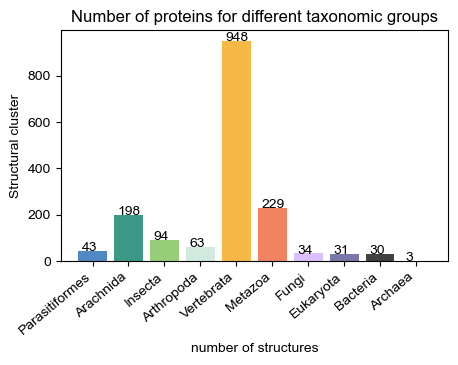

In [26]:
broad_taxon_counts = dict(PCA_TSNE_features['broad_taxon'].value_counts())

broad_taxon_color_mapper = {
    'Parasitiformes': apc.arcadia_all['arcadia:aegean'],
    'Arachnida': apc.arcadia_all['arcadia:seaweed'],
    'Insecta': apc.arcadia_all['arcadia:lime'],
    'Arthropoda': apc.arcadia_all['arcadia:mint'],
    'Vertebrata': apc.arcadia_all['arcadia:canary'], 
    'Metazoa': apc.arcadia_all['arcadia:amber'], 
    'Fungi': apc.arcadia_all['arcadia:periwinkle'], 
    'Eukaryota': apc.arcadia_all['arcadia:aster'], 
    'Bacteria': apc.arcadia_all['arcadia:slate'], 
    'Archaea': apc.arcadia_all['arcadia:dragon']
}

plt.figure(figsize = (5, 3))

plt.bar(x = np.arange(len(broad_taxon_counts)), height = [broad_taxon_counts[sel] for sel in selectors], color = [broad_taxon_color_mapper[sel] for sel in selectors], tick_label = selectors)
plt.xticks(rotation = 40, ha = 'right')

for i, value in enumerate([broad_taxon_counts[sel] for sel in selectors]):
    plt.text(x = i - 0.3, y = value, s = value)
    
plt.xlabel('number of structures')
plt.ylabel('Structural cluster')

plt.title('Number of proteins for different taxonomic groups')
plt.savefig(output_folder + 'figures/TSP_taxon_representation.svg', bbox_inches = 'tight')
plt.show()

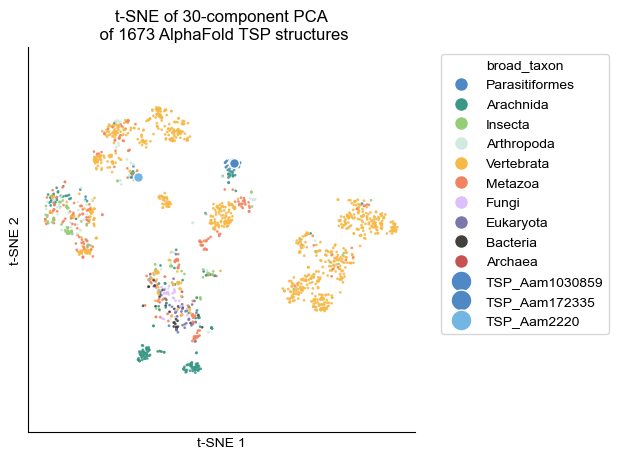

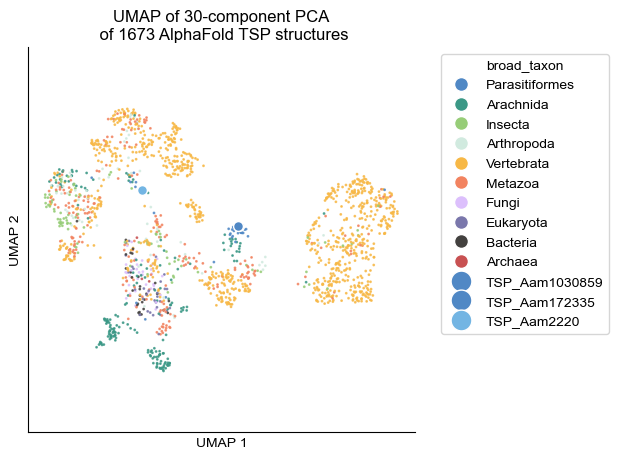

In [27]:
key_points_dict_2 = {
    'TSP_Aam1030859_hit1.pdb': ['TSP_Aam1030859', apc.arcadia_all['arcadia:aegean']],
    'TSP_Aam172335_hit1.pdb': ['TSP_Aam172335', apc.arcadia_all['arcadia:aegean']],
    'TSP_Aam2220_hit1.pdb': ['TSP_Aam2220', apc.arcadia_all['arcadia:vitalblue']]
}

cluster_pca_tsne_plot_loc = figures_folder + 'TSP_filtered_taxa_PCA-UMAP.svg'
plotting.plot_static_categorical(features_df = PCA_TSNE_features, feature = 'broad_taxon', color_mapper = broad_taxon_color_mapper,
               title = 't-SNE of {}-component PCA\n of {} AlphaFold TSP structures'.format(n_components, len(PCA_features)),
               xlabel = 't-SNE 1', ylabel = 't-SNE 2', figsize = (5, 5), save_to = cluster_pca_tsne_plot_loc, 
               key_points_dict = key_points_dict_2, key_points_size = 50,
               s = 1, alpha = 0.8, return_colors = True)

cluster_pca_umap_plot_loc = figures_folder + 'TSP_filtered_taxa_PCA-tSNE.svg'
plotting.plot_static_categorical(features_df = PCA_UMAP_features , feature = 'broad_taxon', color_mapper = broad_taxon_color_mapper,
               title = 'UMAP of {}-component PCA\n of {} AlphaFold TSP structures'.format(n_components, len(PCA_features)),
               xlabel = 'UMAP 1', ylabel = 'UMAP 2', figsize = (5, 5), save_to = cluster_pca_umap_plot_loc,
               key_points_dict = key_points_dict_2, key_points_size = 50,
               s = 1, alpha = 0.8)

In [28]:
vertebrates = agg_features_df_taxlineage[agg_features_df_taxlineage['broad_taxon'] == 'Vertebrata']
vertebrates['taxlineage_dict_keys'] = vertebrates['taxlineage_dict'].apply(lambda x: list(x.keys()))

full_vertebrate_taxon_list = []
for sublist in list(vertebrates['taxlineage_dict_keys']):
    for item in sublist:
        full_vertebrate_taxon_list.append(item)
    
vert_counts_df = pd.DataFrame(pd.value_counts(full_vertebrate_taxon_list))
display(vert_counts_df.head(40))

/var/folders/5b/71_5djmd0p5_yhs0tpbbq68r0000gn/T/ipykernel_45217/1022063143.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  vertebrates['taxlineage_dict_keys'] = vertebrates['taxlineage_dict'].apply(lambda x: list(x.keys()))


,count
Vertebrata,948
Eumetazoa,948
Deuterostomia,948
Chordata,948
Craniata,948
Metazoa,948
Bilateria,948
Opisthokonta,948
Eukaryota,948
cellular organisms,948


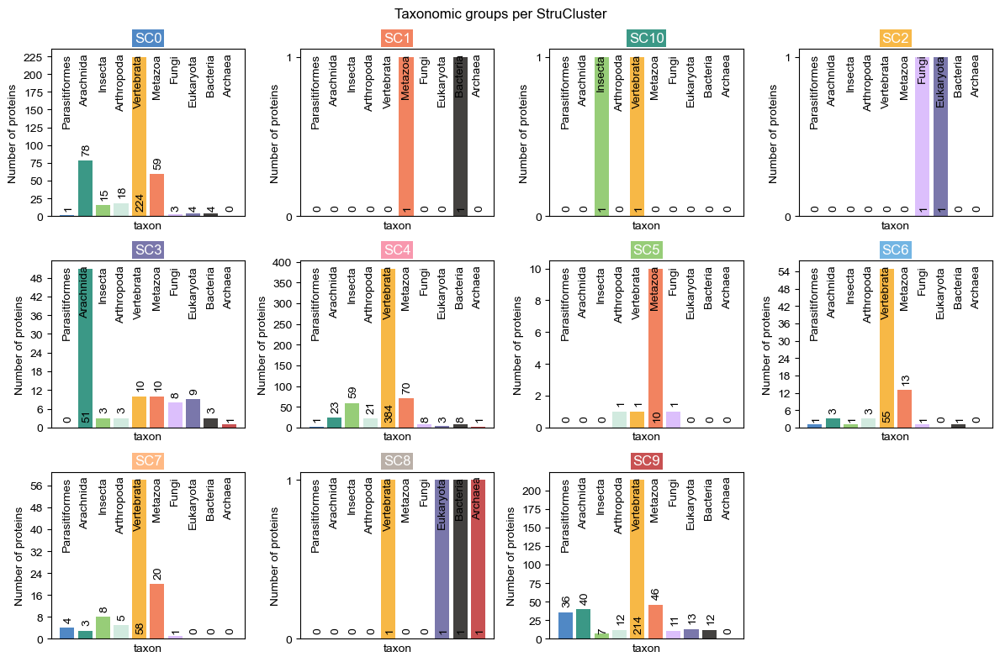

In [398]:
from collections import Counter

afgd = agg_features_df_taxlineage[agg_features_df_taxlineage['StruCluster'] != 'None'].copy(deep = True)
afgd_dict = afgd[['StruCluster', 'broad_taxon']].groupby('StruCluster').agg(lambda x: dict(Counter(x)))

plt.figure(figsize = (12, 8))

for i, (index, dxn) in enumerate(afgd_dict.iterrows()):
    dix = dict(dxn)['broad_taxon']
    
    plt.subplot(3, 4, i + 1)
    
    plt.bar(x = np.arange(len(selectors)), height = [dix[sel] if sel in dix else 0 for sel in selectors], tick_label = selectors, color = [broad_taxon_color_mapper[sel] for sel in selectors])
    plt.setp(plt.gca().xaxis.get_majorticklabels(), va="top", y = 1, rotation = 90)
    
    ymax = max([dix[sel] if sel in dix else 0 for sel in selectors])
    
    for j, value in enumerate([dix[sel] if sel in dix else 0 for sel in selectors]):
        
        if value > ymax / 2 or value < ymax * 0.05:
            plt.text(x = j - 0.2, y = 0 + ymax * 0.05, s = value, rotation = 90)
        else:
            plt.text(x = j - 0.2, y = value + ymax * 0.05, s = value, rotation = 90)
    
    plt.ylabel('Number of proteins')
    plt.xlabel('taxon')
    plt.gca().tick_params(axis = 'x', length = 0)
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    
    plt.title(index, color = 'white', bbox = dict(facecolor = colors[i], edgecolor = 'none', pad = 2))

plt.suptitle('Taxonomic groups per StruCluster')
plt.tight_layout()

plt.savefig(output_folder + 'figures/TSP_taxon_perSC.svg')
plt.show()

In [400]:
afgd_dict2 = afgd_dict.copy(deep = True)

for col in broad_taxon_color_mapper:
    afgd_dict2[col] = afgd_dict2['broad_taxon'].apply(lambda x: x[col] if col in x else 0)

afgd_dict2.drop(columns = ['broad_taxon'], inplace = True)
afgd_sum = afgd_dict2.sum(axis = 'columns', numeric_only = True)
afgd_dict2 = afgd_dict2.div(afgd_sum, axis = 0)
afgd_dict2['top'] = afgd_dict2.idxmax(axis = 1)
afgd_dict2['total'] = afgd_sum
afgd_dict2.sort_index(inplace = True)

display(afgd_dict2)

,Parasitiformes,Arachnida,Insecta,Arthropoda,Vertebrata,Metazoa,Fungi,Eukaryota,Bacteria,Archaea,top,total
StruCluster,,,,,,,,,,,,
SC0,0.002463,0.192118,0.036946,0.044335,0.551724,0.145320,0.007389,0.009852,0.009852,0.000000,Vertebrata,406
SC1,0.000000,0.000000,0.000000,0.000000,0.000000,0.500000,0.000000,0.000000,0.500000,0.000000,Metazoa,2
SC10,0.000000,0.000000,0.500000,0.000000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,Insecta,2
SC2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.500000,0.500000,0.000000,0.000000,Fungi,2
SC3,0.000000,0.520408,0.030612,0.030612,0.102041,0.102041,0.081633,0.091837,0.030612,0.010204,Arachnida,98
SC4,0.001730,0.039792,0.102076,0.036332,0.664360,0.121107,0.013841,0.005190,0.013841,0.001730,Vertebrata,578
SC5,0.000000,0.000000,0.000000,0.076923,0.076923,0.769231,0.076923,0.000000,0.000000,0.000000,Metazoa,13
SC6,0.012821,0.038462,0.012821,0.038462,0.705128,0.166667,0.012821,0.000000,0.012821,0.000000,Vertebrata,78
SC7,0.040404,0.030303,0.080808,0.050505,0.585859,0.202020,0.010101,0.000000,0.000000,0.000000,Vertebrata,99


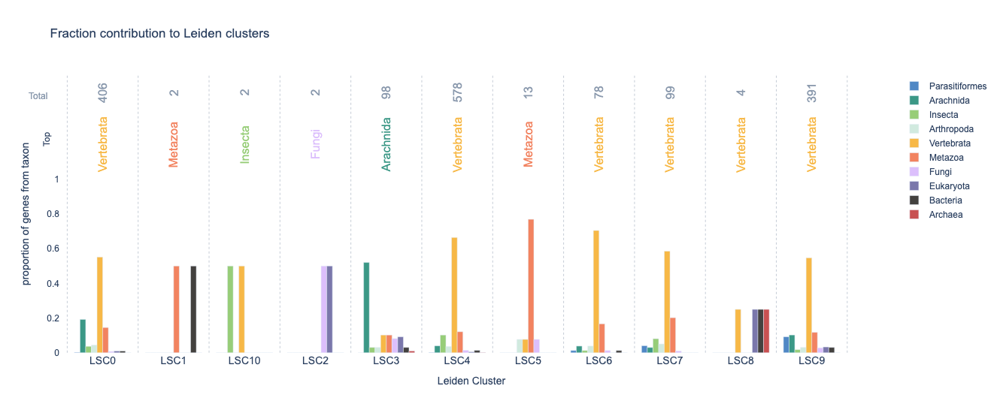

In [409]:
import plotly.graph_objects as go

clusters = [f'L{i}' for i in afgd_dict2.index]
fig = go.Figure(data=[go.Bar(name=col, x=clusters, y=afgd_dict2[col].values, marker_color = broad_taxon_color_mapper[col]) for col in broad_taxon_color_mapper])

fig.add_annotation(x = -0.025, y = 0.8, text = 'Top', showarrow = False, textangle = -90, 
                   xref = 'paper', yref = 'paper')
for i, value in enumerate(afgd_dict2['top'].values):
    fig.add_annotation(x = i, y = 1.2, text = str(value), showarrow = False, textangle = -90, 
                       font_color = broad_taxon_color_mapper[value],
                       font_size = 16)

fig.add_annotation(x = -0.04, y = 0.95, text = 'Total', showarrow = False, 
                   font_color = apc.arcadia_all['arcadia:marineblue'], 
                   xref = 'paper', yref = 'paper', align = 'right')
for i, value in enumerate(afgd_dict2['total'].values):
    fig.add_annotation(x = i, y = 1.5, text = str(value), showarrow = False, textangle = -90, 
                       font_color = apc.arcadia_all['arcadia:marineblue'],
                       font_size = 16)

fig.update_layout(
    title = 'Fraction contribution to Leiden clusters',
    barmode = 'group', width = 900, height = 550,
    xaxis_title = 'Leiden Cluster',
    yaxis_title = 'proportion of genes from taxon',
    plot_bgcolor = 'rgba(0,0,0,0)',
    font=dict(family="Arial"),
    yaxis = dict(
        tickmode = 'array',
        tickvals = np.arange(0, 1.2, 0.2),
        gridcolor = 'rgba(0,0,0,0)'
    ),
    xaxis = dict(
        gridcolor = 'rgba(0,0,0,0)',
        range = [-0.6, len(clusters)],
        tickfont_size = 14
    ),
    shapes = [dict(type = 'line', 
                   x0 = k, y0 = 0, 
                   x1 = k, y1 = 1.6, 
                   line=dict(color = apc.arcadia_all['arcadia:marineblue'], width = 0.5, dash = 'dot')) 
              for k in np.arange(-0.5, len(clusters))]
)

fig.update_xaxes()
fig.update_yaxes()
fig.write_html(output_folder + 'figures/' + 'TSP_taxon_perFS.html')

fig.show()

In [30]:
import igraph as ig
import leidenalg as la

In [47]:
pivoted_df_cleaned = pivoted_df[[i for i in pivoted_df.columns if i in PCA_TSNE_features['filename'].values]]
pivoted_df_cleaned = pivoted_df_cleaned[pivoted_df_cleaned.index.isin(PCA_TSNE_features['filename'].values)]

pivoted_df_cleaned

target,AF-A0A016UFC9-F1-model_v4.pdb,AF-A0A023EHK0-F1-model_v4.pdb,AF-A0A023FSS9-F1-model_v4.pdb,AF-A0A023G0S7-F1-model_v4.pdb,AF-A0A023G9T4-F1-model_v4.pdb,AF-A0A023GC25-F1-model_v4.pdb,AF-A0A034WTW9-F1-model_v4.pdb,AF-A0A058Z864-F1-model_v4.pdb,AF-A0A059F9B8-F1-model_v4.pdb,AF-A0A060VYU0-F1-model_v4.pdb,...,AF-W5MKH3-F1-model_v4.pdb,AF-W5N2B7-F1-model_v4.pdb,AF-W5N8M6-F1-model_v4.pdb,AF-W5UKZ8-F1-model_v4.pdb,AF-W6MEX4-F1-model_v4.pdb,AF-W7TY09-F1-model_v4.pdb,AF-X1WGX6-F1-model_v4.pdb,TSP_Aam1030859_hit1.pdb,TSP_Aam172335_hit1.pdb,TSP_Aam2220_hit1.pdb
query,,,,,,,,,,,,,,,,,,,,,
AF-A0A016UFC9-F1-model_v4.pdb,1.0000,0.0000,0.4409,0.3803,0.4297,0.3659,0.4398,0.0991,0.0000,0.1465,...,0.1566,0.4277,0.0000,0.3525,0.0000,0.0000,0.3496,0.4550,0.4484,0.0000
AF-A0A023EHK0-F1-model_v4.pdb,0.3623,1.0000,0.5159,0.4573,0.5584,0.0000,0.4558,0.2670,0.0000,0.0000,...,0.2819,0.2818,0.5869,0.0000,0.4073,0.0000,0.5608,0.6143,0.5603,0.0000
AF-A0A023FSS9-F1-model_v4.pdb,0.4517,0.0000,1.0000,0.6783,0.6290,0.7571,0.7154,0.4085,0.4954,0.4819,...,0.5160,0.4634,0.0000,0.4533,0.0000,0.0000,0.5204,0.6899,0.7017,0.6199
AF-A0A023G0S7-F1-model_v4.pdb,0.3766,0.0000,0.6783,1.0000,0.6790,0.7358,0.7307,0.5030,0.3283,0.4796,...,0.5481,0.3043,0.4559,0.3879,0.0000,0.0000,0.5416,0.7216,0.8276,0.6895
AF-A0A023G9T4-F1-model_v4.pdb,0.4463,0.0000,0.6339,0.6943,1.0000,0.6865,0.7232,0.3928,0.0000,0.6225,...,0.5853,0.4924,0.0000,0.3525,0.0000,0.0000,0.5423,0.6946,0.8042,0.7145
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AF-W7TY09-F1-model_v4.pdb,0.0000,0.0000,0.3015,0.5779,0.2660,0.6622,0.0000,0.1167,0.6754,0.0000,...,0.0000,0.2819,0.0000,0.0000,0.0000,1.0000,0.6215,0.5107,0.5040,0.0000
AF-X1WGX6-F1-model_v4.pdb,0.2470,0.5608,0.5204,0.5416,0.5577,0.5888,0.5557,0.4457,0.0000,0.4697,...,0.5952,0.4919,0.4474,0.0000,0.5914,0.0000,1.0000,0.5181,0.5215,0.4572
TSP_Aam1030859_hit1.pdb,0.4550,0.0000,0.6899,0.7216,0.6888,0.8495,0.7028,0.3372,0.4292,0.4782,...,0.5774,0.4058,0.5561,0.4498,0.6090,0.5107,0.5181,1.0000,0.8851,0.6412


In [138]:
G = ig.Graph.Weighted_Adjacency(pivoted_df_cleaned)

In [139]:
partition = la.find_partition(G, la.RBConfigurationVertexPartition, n_iterations = 20, resolution_parameter = 1)

In [140]:
PCA_TSNE_features['Leiden'] = partition._membership
PCA_UMAP_features['Leiden'] = partition._membership

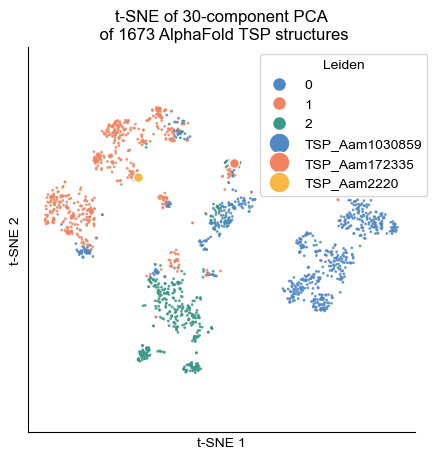

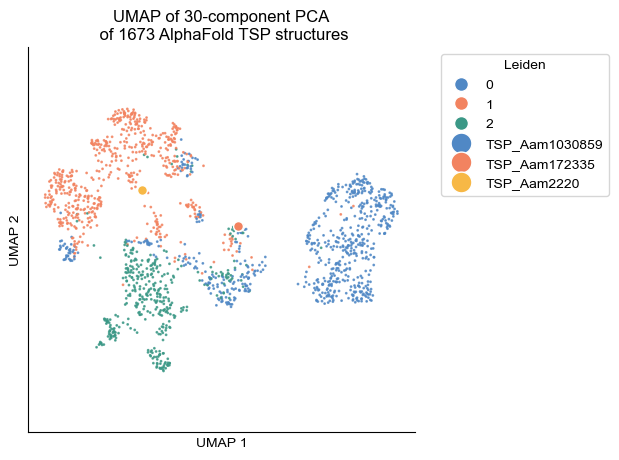

In [141]:
cluster_pca_tsne_plot_loc = figures_folder + 'TSP_filtered_Leiden_PCA-UMAP.svg'
plotting.plot_static_categorical(features_df = PCA_TSNE_features, feature = 'Leiden', color_list = colors, permute = [0.75],
               title = 't-SNE of {}-component PCA\n of {} AlphaFold TSP structures'.format(n_components, len(PCA_features)),
               xlabel = 't-SNE 1', ylabel = 't-SNE 2', figsize = (5, 5), save_to = cluster_pca_tsne_plot_loc, 
               key_points_dict = key_points_dict, key_points_size = 50,
               s = 1, alpha = 0.8, return_colors = True)

cluster_pca_umap_plot_loc = figures_folder + 'TSP_filtered_Leiden_PCA-tSNE.svg'
plotting.plot_static_categorical(features_df = PCA_UMAP_features , feature = 'Leiden', color_list = colors, permute = [0.75],
               title = 'UMAP of {}-component PCA\n of {} AlphaFold TSP structures'.format(n_components, len(PCA_features)),
               xlabel = 'UMAP 1', ylabel = 'UMAP 2', figsize = (5, 5), save_to = cluster_pca_umap_plot_loc,
               key_points_dict = key_points_dict, key_points_size = 50,
               s = 1, alpha = 0.8)

In [147]:
import scanpy as sc

In [154]:
pivoted_df_path = '/Users/dennis/Code/gene-family-cartography/output/20230418_test/all_by_all_tmscore_simm_matrix.tsv'

adata = sc.read_csv(pivoted_df_path, delimiter = '\t')

/Users/dennis/miniconda3/envs/cartography/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


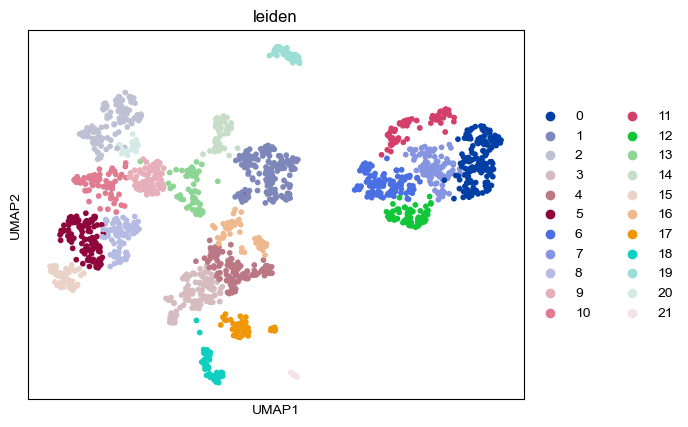

In [167]:
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata)
sc.pl.umap(adata, color = 'leiden')

In [182]:
leiden_membership = dict(adata.obs['leiden'])
PCA_TSNE_features['sc_Leiden'] = [leiden_membership[i] for i in leiden_membership if i in PCA_TSNE_features['filename'].values]
PCA_UMAP_features['sc_Leiden'] = [leiden_membership[i] for i in leiden_membership if i in PCA_UMAP_features['filename'].values]

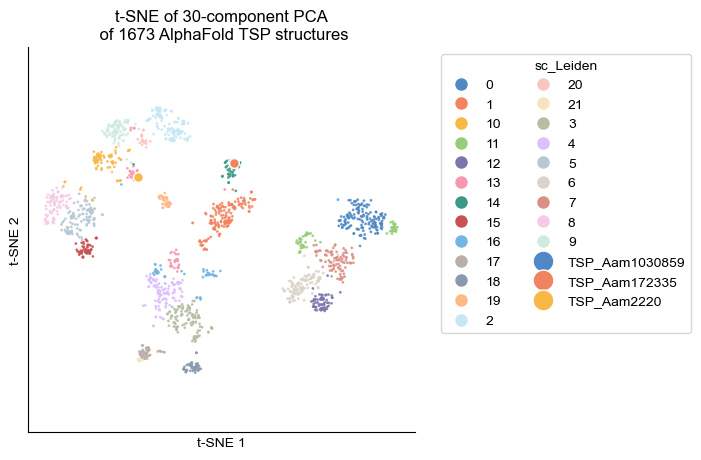

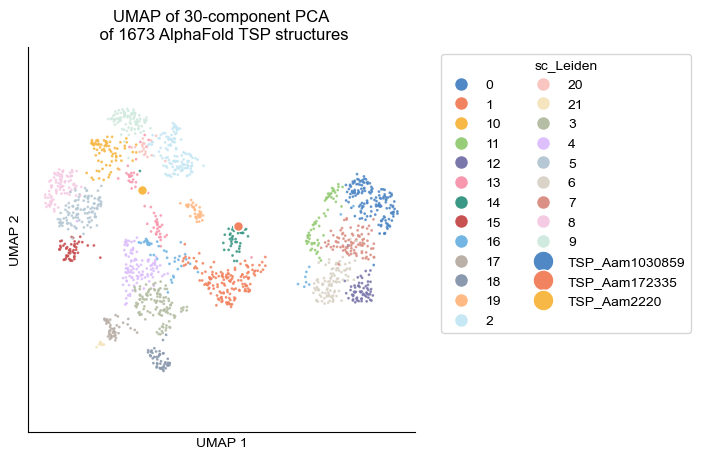

In [730]:
cluster_pca_tsne_plot_loc = figures_folder + 'TSP_filtered_sc-Leiden_PCA-UMAP.svg'
sc_discrete_map = plotting.plot_static_categorical(features_df = PCA_TSNE_features, feature = 'sc_Leiden', color_list = colors, permute = [0.75],
               title = 't-SNE of {}-component PCA\n of {} AlphaFold TSP structures'.format(n_components, len(PCA_features)),
               xlabel = 't-SNE 1', ylabel = 't-SNE 2', figsize = (5, 5), save_to = cluster_pca_tsne_plot_loc, 
               key_points_dict = key_points_dict, key_points_size = 50,
               s = 1, alpha = 0.8, return_colors = True)

cluster_pca_umap_plot_loc = figures_folder + 'TSP_filtered_sc-Leiden_PCA-tSNE.svg'
plotting.plot_static_categorical(features_df = PCA_UMAP_features , feature = 'sc_Leiden', color_list = colors, permute = [0.75],
               title = 'UMAP of {}-component PCA\n of {} AlphaFold TSP structures'.format(n_components, len(PCA_features)),
               xlabel = 'UMAP 1', ylabel = 'UMAP 2', figsize = (5, 5), save_to = cluster_pca_umap_plot_loc,
               key_points_dict = key_points_dict, key_points_size = 50,
               s = 1, alpha = 0.8)

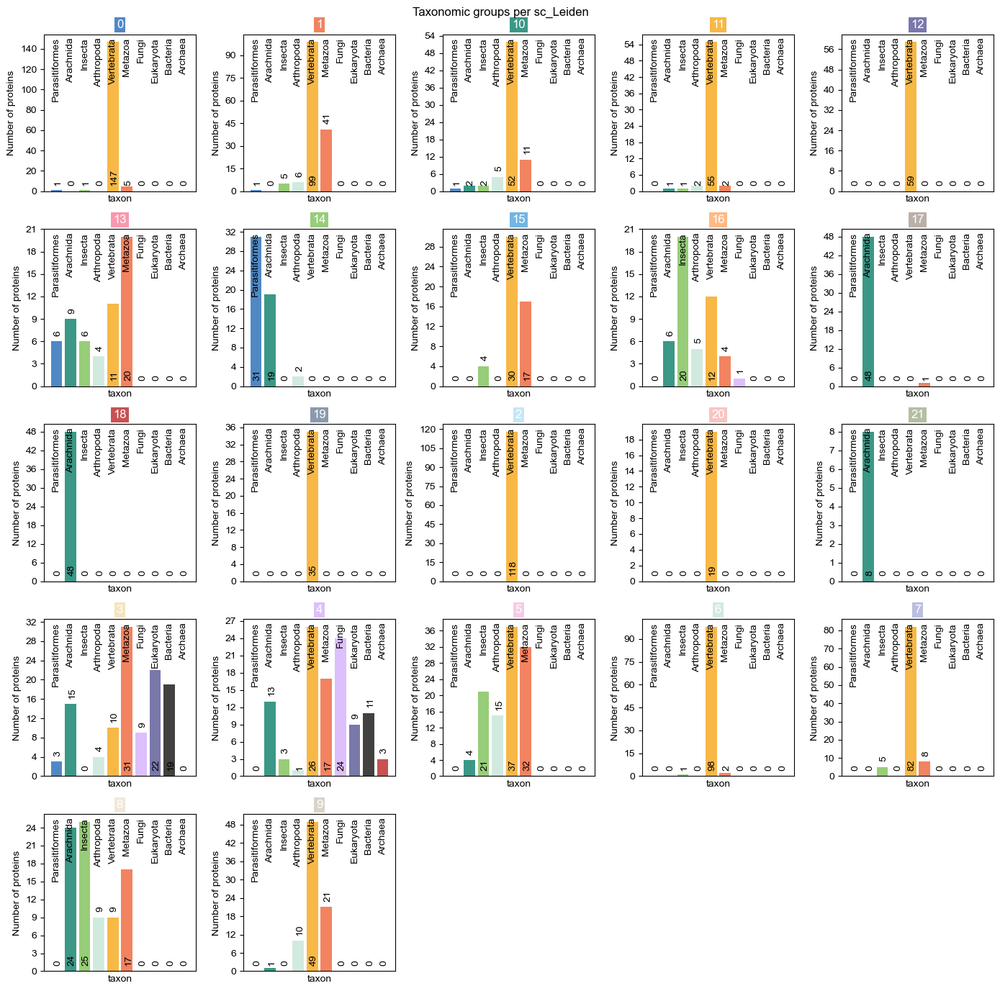

In [218]:
from collections import Counter

afgd_dict = PCA_TSNE_features[['sc_Leiden', 'broad_taxon']].groupby('sc_Leiden').agg(lambda x: dict(Counter(x)))

plt.figure(figsize = (14, 14))

for i, (index, dxn) in enumerate(afgd_dict.iterrows()):
    dix = dict(dxn)['broad_taxon']
    
    plt.subplot(5, 5, i + 1)
    
    plt.bar(x = np.arange(len(selectors)), height = [dix[sel] if sel in dix else 0 for sel in selectors], tick_label = selectors, color = [broad_taxon_color_mapper[sel] for sel in selectors])
    plt.setp(plt.gca().xaxis.get_majorticklabels(), va="top", y = 1, rotation = 90)
    
    ymax = max([dix[sel] if sel in dix else 0 for sel in selectors])
    
    for j, value in enumerate([dix[sel] if sel in dix else 0 for sel in selectors]):
        
        if value > ymax / 2 or value < ymax * 0.05:
            plt.text(x = j - 0.2, y = 0 + ymax * 0.05, s = value, rotation = 90)
        else:
            plt.text(x = j - 0.2, y = value + ymax * 0.05, s = value, rotation = 90)
    
    plt.ylabel('Number of proteins')
    plt.xlabel('taxon')
    plt.gca().tick_params(axis = 'x', length = 0)
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    
    plt.title(index, color = 'white', bbox = dict(facecolor = colors[i], edgecolor = 'none', pad = 2))

plt.suptitle('Taxonomic groups per sc_Leiden')
plt.tight_layout()

plt.savefig(output_folder + 'figures/TSP_taxon_perscLeiden.svg')
plt.show()

In [219]:
afgd_dict

,broad_taxon
sc_Leiden,
0,"{'Vertebrata': 147, 'Metazoa': 5, 'Parasitifor..."
1,"{'Metazoa': 41, 'Vertebrata': 99, 'Arthropoda'..."
10,"{'Arthropoda': 5, 'Arachnida': 2, 'Metazoa': 1..."
11,"{'Arachnida': 1, 'Vertebrata': 55, 'Metazoa': ..."
12,{'Vertebrata': 59}
13,"{'Arachnida': 9, 'Metazoa': 20, 'Vertebrata': ..."
14,"{'Parasitiformes': 31, 'Arachnida': 19, 'Arthr..."
15,"{'Vertebrata': 30, 'Insecta': 4, 'Metazoa': 17}"
16,"{'Metazoa': 4, 'Arthropoda': 5, 'Vertebrata': ..."


In [269]:
afgd_dict2 = afgd_dict.copy(deep = True)

for col in broad_taxon_color_mapper:
    afgd_dict2[col] = afgd_dict2['broad_taxon'].apply(lambda x: x[col] if col in x else 0)

afgd_dict2.drop(columns = ['broad_taxon'], inplace = True)
afgd_sum = afgd_dict2.sum(axis = 'columns', numeric_only = True)
afgd_dict2 = afgd_dict2.div(afgd_sum, axis = 0)
afgd_dict2['top'] = afgd_dict2.idxmax(axis = 1)
afgd_dict2['total'] = afgd_sum
afgd_dict2.index = afgd_dict2.index.astype(int)
afgd_dict2.sort_index(inplace = True)

display(afgd_dict2)

,Parasitiformes,Arachnida,Insecta,Arthropoda,Vertebrata,Metazoa,Fungi,Eukaryota,Bacteria,Archaea,top,total
sc_Leiden,,,,,,,,,,,,
0,0.006494,0.000000,0.006494,0.000000,0.954545,0.032468,0.000000,0.000000,0.000000,0.000000,Vertebrata,154
1,0.006579,0.000000,0.032895,0.039474,0.651316,0.269737,0.000000,0.000000,0.000000,0.000000,Vertebrata,152
2,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,Vertebrata,118
3,0.026549,0.132743,0.000000,0.035398,0.088496,0.274336,0.079646,0.194690,0.168142,0.000000,Metazoa,113
4,0.000000,0.121495,0.028037,0.009346,0.242991,0.158879,0.224299,0.084112,0.102804,0.028037,Vertebrata,107
5,0.000000,0.036697,0.192661,0.137615,0.339450,0.293578,0.000000,0.000000,0.000000,0.000000,Vertebrata,109
6,0.000000,0.000000,0.009901,0.000000,0.970297,0.019802,0.000000,0.000000,0.000000,0.000000,Vertebrata,101
7,0.000000,0.000000,0.052632,0.000000,0.863158,0.084211,0.000000,0.000000,0.000000,0.000000,Vertebrata,95
8,0.000000,0.285714,0.297619,0.107143,0.107143,0.202381,0.000000,0.000000,0.000000,0.000000,Insecta,84


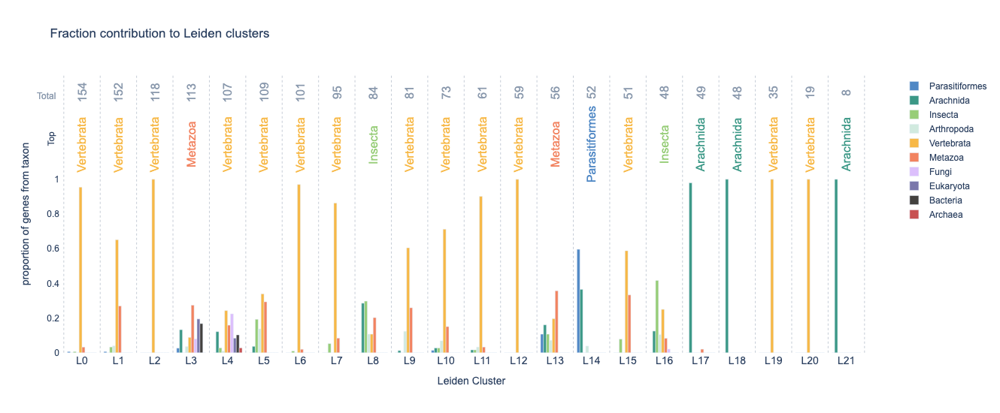

In [397]:
import plotly.graph_objects as go

clusters = [f'L{i}' for i in afgd_dict2.index]
fig = go.Figure(data=[go.Bar(name=col, x=clusters, y=afgd_dict2[col].values, marker_color = broad_taxon_color_mapper[col]) for col in broad_taxon_color_mapper])

fig.add_annotation(x = -0.02, y = 0.8, text = 'Top', showarrow = False, textangle = -90, 
                   xref = 'paper', yref = 'paper')
for i, value in enumerate(afgd_dict2['top'].values):
    fig.add_annotation(x = i, y = 1.2, text = str(value), showarrow = False, textangle = -90, 
                       font_color = broad_taxon_color_mapper[value],
                       font_size = 16)

fig.add_annotation(x = -0.03, y = 0.95, text = 'Total', showarrow = False, 
                   font_color = apc.arcadia_all['arcadia:marineblue'], 
                   xref = 'paper', yref = 'paper', align = 'right')
for i, value in enumerate(afgd_dict2['total'].values):
    fig.add_annotation(x = i, y = 1.5, text = str(value), showarrow = False, textangle = -90, 
                       font_color = apc.arcadia_all['arcadia:marineblue'],
                       font_size = 16)

fig.update_layout(
    title = 'Fraction contribution to Leiden clusters',
    barmode = 'group', width = 1300, height = 550,
    xaxis_title = 'Leiden Cluster',
    yaxis_title = 'proportion of genes from taxon',
    plot_bgcolor = 'rgba(0,0,0,0)',
    font=dict(family="Arial"),
    yaxis = dict(
        tickmode = 'array',
        tickvals = np.arange(0, 1.2, 0.2),
        gridcolor = 'rgba(0,0,0,0)'
    ),
    xaxis = dict(
        gridcolor = 'rgba(0,0,0,0)',
        range = [-0.6, len(clusters)],
        tickfont_size = 14
    ),
    shapes = [dict(type = 'line', 
                   x0 = k, y0 = 0, 
                   x1 = k, y1 = 1.6, 
                   line=dict(color = apc.arcadia_all['arcadia:marineblue'], width = 0.5, dash = 'dot')) 
              for k in np.arange(-0.5, len(clusters))]
)

fig.update_xaxes()
fig.update_yaxes()
fig.write_html(output_folder + 'figures/' + 'TSP_taxon_perSC.html')

fig.show()

In [513]:
df['Length'] = df['Length'].astype(int)

In [638]:
import matplotlib as mpl
import arcadia_pycolor as apc


cmap = mpl.colormaps['arcadia:viridis']


In [665]:
colors_dict

{'SC0': '#5088C5',
 'SC1': '#F28360',
 'SC10': '#F7B846',
 'SC2': '#97CD78',
 'SC3': '#7A77AB',
 'SC4': '#F898AE',
 'SC5': '#3B9886',
 'SC6': '#C85152',
 'SC7': '#73B5E3',
 'SC8': '#BAB0A8',
 'SC9': '#8A99AD'}

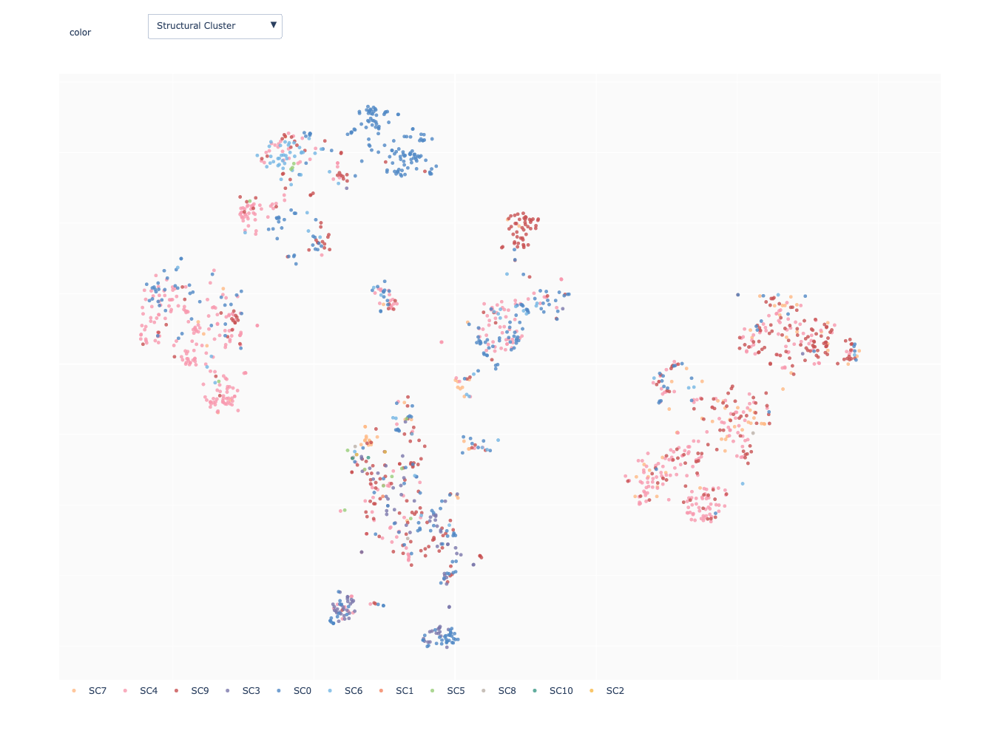

In [789]:
import plotly.express as px
import plotly.graph_objects as go
import pandas as pd

arcadia_viridis = [[0, "#341E60"], [0.49, '#5088C5'], [0.75, '#97CD78'], [1, "yellow"]]

df = PCA_TSNE_features

marker_size = 5
marker_opacity = 0.8

colors_dict = dict(zip(sorted(df['StruCluster'].unique()), list(apc.arcadia_Accent_all.values())))

hover_data = {
    'x': False,
    'y': False,
    'StruCluster': True,
    'sc_Leiden': True,
    'Length': True,
    'Annotation': True,
    'Protein names': True,
    'Organism': True
}

custom_data = ['From', 'Organism', 'StruCluster', 'sc_Leiden', 'Length', 'Annotation', 'Protein names', 'broad_taxon']

hovertemplate = "<br>".join([
        "<b>%{customdata[0]}</b>",
        "<b>Species:</b> %{customdata[1]}",
        "<b>Broad Taxonomic group:</b> %{customdata[7]}",
        "<b>FoldSeek Cluster:</b> %{customdata[2]}",
        "<b>Leiden Cluster:</b> %{customdata[3]}",
        "<b>Protein Length:</b> %{customdata[4]}",
        "<b>Annotation Confidence:</b> %{customdata[5]}",
        "<b>UniProt Name:</b></br>%{customdata[6]}",
    ])


fig1 = px.scatter(df, "x", "y", color = "StruCluster", color_discrete_map = colors_dict, 
                  hover_name = 'From', custom_data = custom_data)
fig1.update_traces(marker = dict(size = marker_size, opacity = marker_opacity), 
                   hovertemplate = hovertemplate)

fig2 = px.scatter(df, "x", "y", color = "Length", color_continuous_scale = arcadia_viridis, 
                  hover_name = 'From', hover_data = custom_data)
fig2.update_traces(marker = dict(size = marker_size,
                                 colorscale = arcadia_viridis,
                                color = df['Length'],
                                showscale = True, 
                                 opacity = marker_opacity),
                  hovertemplate = hovertemplate)

fig3 = px.scatter(df, 'x', 'y', color = "Annotation", color_discrete_map = annotation_color_mapper, 
                  hover_name = 'From', hover_data = custom_data)
fig3.update_traces(marker = dict(size = marker_size, opacity = marker_opacity),
                  hovertemplate = hovertemplate)

fig4 = px.scatter(df, 'x', 'y', color = 'sc_Leiden', color_discrete_map = sc_discrete_map, 
                  hover_name = 'From', hover_data = custom_data)
fig4.update_traces(marker = dict(size = marker_size, opacity = marker_opacity),
                  hovertemplate = hovertemplate)

fig5 = px.scatter(df, 'x', 'y', color = 'broad_taxon', color_discrete_map = broad_taxon_color_mapper, 
                  hover_name = 'From', hover_data = custom_data)
fig5.update_traces(marker = dict(size = marker_size, opacity = marker_opacity),
                  hovertemplate = hovertemplate)

fig = go.Figure()

for i in fig1.data:
    fig.add_trace(go.Scattergl(i, visible=True))

manual_color = [mpl.colors.rgb2hex(cmap(i / max(fig2.data[0].marker.color))) for i in fig2.data[0].marker.color]
fig.add_trace(go.Scattergl(fig2.data[0], visible=False))

for i in fig3.data:
    fig.add_trace(go.Scattergl(i, visible=False))
    
for i in fig4.data:
    fig.add_trace(go.Scattergl(i, visible=False))

for i in fig5.data:
    fig.add_trace(go.Scattergl(i, visible=False))

fig.update_layout(
    updatemenus=[
        dict(
            buttons=list([
                dict(
                    args=["visible", [True] * len(fig1.data) + [False] + [False] * len(fig3.data) + [False] * len(fig4.data) + [False] * len(fig5.data)],
                    label='Structural Cluster',
                    method="restyle"
                ),
                dict(
                    args=["visible", [False] * len(fig1.data) + [False] + [False] * len(fig3.data) + [True] * len(fig4.data) + [False] * len(fig5.data)],
                    label= 'Leiden cluster',
                    method="restyle"
                ),
                dict(
                    args=["visible", [False] * len(fig1.data) + [False] + [False] * len(fig3.data) + [False] * len(fig4.data) + [True] * len(fig5.data)],
                    label= 'Broad taxonomic group',
                    method="restyle"
                ),
                dict(
                    args=["visible", [False] * len(fig1.data) + [False] + [True] * len(fig3.data) + [False] * len(fig4.data) + [False] * len(fig5.data)],
                    label= 'Annotation',
                    method="restyle"
                ),
                dict(
                    args=["visible", [False] * len(fig1.data) + [True] + [False] * len(fig3.data) + [False] * len(fig4.data) + [False] * len(fig5.data)],
                    label= 'Protein length',
                    method="restyle"
                ),
            ]),
            showactive=True,
            x=0.1,
            xanchor="left",
            y=1.1,
            yanchor="top"
        ),
    ]
)

fig.update_layout(
    width = 1000, height = 1000,
    annotations=[
        dict(text="color", x=0.01, xref="paper", y=1.08, yref="paper",
             align="left", showarrow=False),
    ],
    plot_bgcolor= '#fafafa'
)
fig.update_layout(xaxis = dict(showticklabels = False), yaxis = dict(showticklabels = False))
fig.update_yaxes(scaleanchor = "x", scaleratio = 1)
fig.update_layout(legend=dict(orientation = "h", yanchor="top", y = 0, xanchor="left", x = 0))
fig.update_layout(coloraxis_colorbar=dict(yanchor="top", y=0, x=0.5,
                                          ticks="outside", orientation = 'h'))

fig.write_html(output_folder + 'figures/TSP_Scatter_overlay.html')
fig.show()

In [646]:
fig2.data[0].marker.color

array([897, 190, 108, ..., 107, 107,  83])

In [537]:
type(fig2.data[0])

plotly.graph_objs._scattergl.Scattergl

In [723]:
df[df['sc_Leiden'] == '17']

,filename,uniprot_id,StruCluster,From,Entry,Reviewed,Entry Name,Protein names,Gene Names,Organism,...,Fragment,Annotation,Caution,Organism (ID),x,y,broad_taxon,Leiden,Leiden_sc,sc_Leiden
100,AF-A0A0L8HEK4-F1-model_v4.pdb,A0A0L8HEK4,SC9,A0A0L8HEK4,A0A0L8HEK4,unreviewed,A0A0L8HEK4_OCTBM,Uncharacterized protein,OCBIM_22016604mg,Octopus bimaculoides (California two-spotted o...,...,None,1.0,None,37653.0,-11.483186,-33.893528,Metazoa,2,2,17
1265,AF-A3F7X1-F1-model_v4.pdb,A3F7X1,SC9,A3F7X1,A3F7X1,reviewed,TXLT4_LASSB,U2-theraphotoxin-Lsp1a (U2-TRTX-Lsp1a) (LTx4),None,Lasiodora sp. (strain IBSP 8539) (Brazilian sa...,...,None,2.0,None,300858.0,-11.296620,-34.006763,Arachnida,2,2,17
1287,AF-B3EWF2-F1-model_v4.pdb,B3EWF2,SC0,B3EWF2,B3EWF2,reviewed,LTX1A_LACTA,Latartoxin-1a (LtTx-1a),None,Lachesana tarabaevi (Spider),...,None,4.0,None,379576.0,-16.517866,-32.298203,Arachnida,2,2,17
1302,AF-B6DCV3-F1-model_v4.pdb,B6DCV3,SC4,B6DCV3,B6DCV3,reviewed,TX603_LYCSI,U6-lycotoxin-Ls1d (Toxin-like structure LSTX-F3),None,Lycosa singoriensis (Wolf spider) (Aranea sing...,...,None,2.0,None,434756.0,-15.968627,-36.153790,Arachnida,2,2,17
1306,AF-B6DCV7-F1-model_v4.pdb,B6DCV7,SC3,B6DCV7,B6DCV7,reviewed,TX607_LYCSI,U6-lycotoxin-Ls1d (Toxin-like structure LSTX-F7),None,Lycosa singoriensis (Wolf spider) (Aranea sing...,...,None,2.0,None,434756.0,-15.048879,-36.087826,Arachnida,2,2,17
1310,AF-B6DCW1-F1-model_v4.pdb,B6DCW1,SC3,B6DCW1,B6DCW1,reviewed,TX701_LYCSI,U7-lycotoxin-Ls1a (Toxin-like structure LSTX-G1),None,Lycosa singoriensis (Wolf spider) (Aranea sing...,...,None,2.0,None,434756.0,-15.798302,-34.791382,Arachnida,2,2,17
1311,AF-B6DCW2-F1-model_v4.pdb,B6DCW2,SC3,B6DCW2,B6DCW2,reviewed,TX702_LYCSI,U7-lycotoxin-Ls1a (Toxin-like structure LSTX-G2),None,Lycosa singoriensis (Wolf spider) (Aranea sing...,...,None,2.0,None,434756.0,-17.125774,-34.431057,Arachnida,2,2,17
1312,AF-B6DCW3-F1-model_v4.pdb,B6DCW3,SC9,B6DCW3,B6DCW3,reviewed,TX703_LYCSI,U7-lycotoxin-Ls1d (Toxin-like structure LSTX-G3),None,Lycosa singoriensis (Wolf spider) (Aranea sing...,...,None,2.0,None,434756.0,-15.995353,-34.899784,Arachnida,2,2,17
1313,AF-B6DCW4-F1-model_v4.pdb,B6DCW4,SC3,B6DCW4,B6DCW4,reviewed,TX704_LYCSI,U7-lycotoxin-Ls1e (Toxin-like structure LSTX-G4),None,Lycosa singoriensis (Wolf spider) (Aranea sing...,...,None,2.0,None,434756.0,-15.327906,-34.921127,Arachnida,2,2,17
1314,AF-B6DCW5-F1-model_v4.pdb,B6DCW5,SC3,B6DCW5,B6DCW5,reviewed,TX705_LYCSI,U7-lycotoxin-Ls1f (Toxin-like structure LSTX-G5),None,Lycosa singoriensis (Wolf spider) (Aranea sing...,...,None,2.0,None,434756.0,-17.314491,-34.081493,Arachnida,2,2,17


In [887]:
from Bio.PDB import CEAligner
import os
import urllib.request
from Bio.PDB import PDBParser, Selection, cealign
import numpy as np
import py3Dmol
from Bio.PDB import PDBIO
#get filepath from pdb name

file1 = output_folder + 'alphafold/TSP_Aam1030859_hit1.pdb'
file2 = output_folder + 'alphafold/AF-A0A0l8HEK4-F1-model_v4.pdb'

pdb1_filename = file1
pdb2_filename = file2
# Load the PDB files
pdb1 = PDBParser().get_structure('pdb1', pdb1_filename)
pdb2 = PDBParser().get_structure('pdb2', pdb2_filename)
#align the structures with cealigner
aligner=CEAligner()
aligner.set_reference(pdb1)
aligner.align(pdb2, transform=True)
print(f"RMSD: {aligner.rms: .2f}")
io = PDBIO()
io.set_structure(pdb2)
io.save('aligned_structure2.pdb')
io.set_structure(pdb1)
io.save('reference_structure2.pdb')

RMSD:  4.57


In [888]:
# Initialize the view object
view = py3Dmol.view(width=800, height=600)
# Load the PDB fils
with open('reference_structure2.pdb', 'r') as f:
    pdb_data1 = f.read()
with open('aligned_structure2.pdb', 'r') as f:
    pdb_data2 = f.read()
view = py3Dmol.view(width=800, height=600)
view.addModel(pdb_data1, 'pdb')
view.addModel(pdb_data2, 'pdb')
view.setStyle({'model': 0}, {'cartoon': {'color': apc.arcadia_all['arcadia:aegean']}})
view.setStyle({'model': 1}, {'cartoon': {'color': apc.arcadia_all['arcadia:amber']}})

view.addLabel(os.path.basename(file1), {'backgroundColor': 'white', 'backgroundOpacity': 0.1, 'fontColor': apc.arcadia_all['arcadia:aegean'], 'useScreen': True, 'position': {'x': 0, 'y': 10, 'z': 0}})
view.addLabel(os.path.basename(file2), {'backgroundColor': 'white', 'backgroundOpacity': 0.1, 'fontColor': apc.arcadia_all['arcadia:amber'], 'useScreen': True, 'position': {'x': 0, 'y': 30, 'z': 0}})

view.zoomTo()
view.show()

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [839]:
help(py3Dmol.view)

Help on class view in module py3Dmol:

class view(builtins.object)
 |  view(query='', width=640, height=480, viewergrid=None, data=None, style=None, linked=True, options={}, js='https://cdnjs.cloudflare.com/ajax/libs/3Dmol/2.0.1/3Dmol-min.js')
 |  
 |  A class for constructing embedded 3Dmol.js views in ipython notebooks.
 |  The results are completely static which means there is no need for there
 |  to be an active kernel but also that there is no communication between
 |  the javascript viewer and ipython.
 |  
 |  Optionally, a viewergrid tuple (rows,columns) can be passed to create
 |  a grid of viewers in a single canvas object.  Successive commands than need to
 |  specify which viewer they apply to (with viewer=(r,c)) or will apply to all
 |  viewers in the grid.
 |  
 |  The API for the created object is exactly that for $3Dmol.GLViewer, with
 |  the exception that the functions all return None.
 |  http://3dmol.org/doc/GLViewer.html
 |  
 |  Methods defined here:
 |  
 |  __g

In [489]:
groupedby_agg_df = PCA_TSNE_features.groupby('sc_Leiden').agg(lambda x: [i for i in x])['Protein names']

summary_dict = {}
str_summary_dict = {}
len_dict = {}

wc_dict = {}

from wordcloud import WordCloud

exclude_words = ['protein', 'None']

for i, (clu, values) in enumerate(groupedby_agg_df.items()):
    summary_dict[clu] = pd.DataFrame(pd.value_counts(values))
    len_dict[clu] = len(values)
    annot_word_list = ' '.join(list(values)).split(' ')
    sanitized_word_list = [word for word in annot_word_list if word not in exclude_words]
    str_summary = dict(pd.value_counts( sanitized_word_list, normalize = True))
    str_summary_dict[clu] = str_summary
    wc_dict[clu] = WordCloud(width = 500, height = 500,
                             background_color = 'white',
                            color_func = lambda *args, **kwargs: colors[i]).generate_from_frequencies(str_summary)

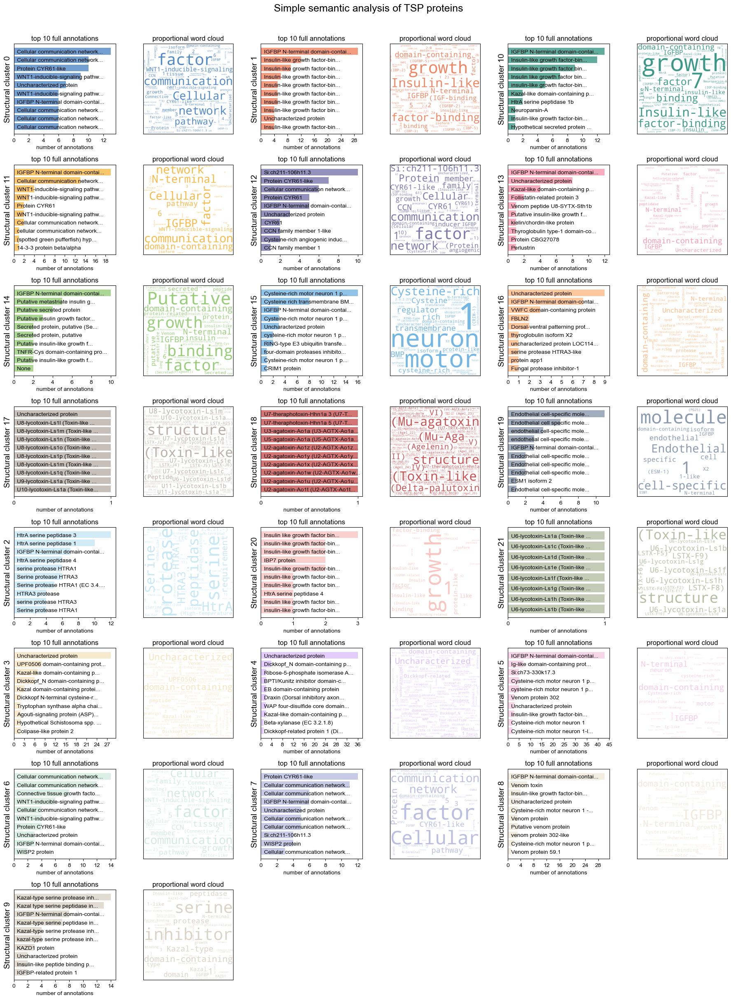

In [496]:
top_n = 10
max_str_len = 30

plt.figure(figsize = (18, 24))
plt.suptitle('Simple semantic analysis of TSP proteins', y = 1.01, fontsize = 18)

for i, clu in enumerate(summary_dict.keys()):
    plt.subplot(8, 6, i * 2 + 1)
    
    top_n_df = summary_dict[clu].head(top_n)
    
    labels = [i[:max_str_len] + '...' if len(i) > max_str_len else i for i in list(top_n_df.index)]
    widths = list(top_n_df['count'])
    
    plt.barh(y = np.arange(len(widths)), width = widths, tick_label = labels, color = colors[i], alpha = 0.8)
    plt.gca().invert_yaxis()
    plt.setp(plt.gca().yaxis.get_majorticklabels(), ha="left", x = 0.05)
    plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
    plt.gca().tick_params(axis = 'y', length = 0)
    plt.ylabel(f'Structural cluster {clu}', fontsize = 14)
    plt.xlabel('number of annotations')
    plt.title(f'top {top_n} full annotations')
    
    plt.subplot(8, 6, i * 2 + 2)
    plt.imshow(wc_dict[clu])
    plt.gca().set_xticks([])
    plt.gca().set_yticks([])
    plt.title('proportional word cloud')

plt.tight_layout()

plt.savefig(output_folder + 'figures/TSP_protein_semantic_analysis_Leiden.svg', bbox_inches = 'tight')
plt.show()

In [883]:
def plot_structure_pair(file1: str, file2: str, 
                        color1 = 'red', color2 = 'blue',
                        width = 800, height = 600, style = 'cartoon',
                        label_dict = {}):
    #get filepath from pdb name
    pdb1_filename = file1
    pdb2_filename = file2
    # Load the PDB files
    pdb1 = PDBParser().get_structure('pdb1', pdb1_filename)
    pdb2 = PDBParser().get_structure('pdb2', pdb2_filename)
    #align the structures with cealigner
    aligner=CEAligner()
    aligner.set_reference(pdb1)
    aligner.align(pdb2, transform=True)
    print(f"RMSD: {aligner.rms: .2f}")
    io = PDBIO()
    io.set_structure(pdb2)
    io.save('aligned_structure2.pdb')
    io.set_structure(pdb1)
    io.save('reference_structure2.pdb')

    # Initialize the view object
    view = py3Dmol.view(width=width, height=height)
    
    # Load the PDB fils
    with open('reference_structure2.pdb', 'r') as f:
        pdb_data1 = f.read()
    with open('aligned_structure2.pdb', 'r') as f:
        pdb_data2 = f.read()
    view = py3Dmol.view(width=width, height=height)
    view.addModel(pdb_data1, 'pdb')
    view.addModel(pdb_data2, 'pdb')
    
    if style == 'cartoon' or style == 'stick':
        view.setStyle({'model': 0}, {style: {'color': color1}})
        view.setStyle({'model': 1}, {style: {'color': color2}})
    else:
        raise Exception('Must choose "cartoon" or "stick" as style.')
        
    if label_dict != {}:
        label1 = label_dict[file1]
        label2 = label_dict[file2]
    else:
        label1 = os.path.basename(file1)
        label2 = os.path.basename(file2)
    
    view.addLabel(label1, {'backgroundColor': 'white', 
                           'backgroundOpacity': 0.1, 
                           'fontColor': color1, 
                           'useScreen': True, 
                           'position': {'x': 0, 'y': 10, 'z': 0}})
    view.addLabel(label2, {'backgroundColor': 'white', 
                           'backgroundOpacity': 0.1, 
                           'fontColor': color2, 
                           'useScreen': True, 
                           'position': {'x': 0, 'y': 30, 'z': 0}})
    view.zoomTo()
    return view.show()

In [886]:
file1 = output_folder + 'alphafold/AF-A0A0L8HEK4-F1-model_v4.pdb'
file2 = output_folder + 'alphafold/AF-A3F7X1-F1-model_v4.pdb'

pdbplot = plot_structure_pair(file1, file2, 
                    color1 = apc.arcadia_all['arcadia:amber'],
                    color2 = apc.arcadia_all['arcadia:seaweed'],
                    label_dict = {file1: 'Octopus', file2: 'Spider'})

RMSD:  5.69


You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [889]:
file1 = output_folder + 'alphafold/TSP_Aam1030859_hit1.pdb'
file2 = output_folder + 'alphafold/TSP_Aam172335_hit1.pdb'

pdbplot = plot_structure_pair(file1, file2, 
                    color1 = apc.arcadia_all['arcadia:amber'],
                    color2 = apc.arcadia_all['arcadia:seaweed'],
                    label_dict = {file1: 'Tick 1', file2: 'Tick 2'})

RMSD:  2.23


You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol